In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from matplotlib import ticker
import statsmodels.api as sm
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# Đọc dữ liệu từng năm 2022 2023 2024
df_2022 = pd.read_csv('diem2022.csv')
df_2023 = pd.read_csv('diem2023.csv')
df_2024 = pd.read_csv('diem2024.csv')
gdf = gpd.read_file('diaphantinh.geojson')
# Nối dữ liệu 3 năm thành 1 Dataframe tổng
df_all = pd.concat([df_2024,df_2023,df_2022], ignore_index=True)
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3074623 entries, 0 to 3074622
Data columns (total 17 columns):
 #   Column     Dtype  
---  ------     -----  
 0   sbd        int64  
 1   toan       float64
 2   ngu_van    float64
 3   ngoai_ngu  float64
 4   vat_li     float64
 5   hoa_hoc    float64
 6   sinh_hoc   float64
 7   lich_su    float64
 8   dia_li     float64
 9   gdcd       float64
 10  a00        float64
 11  a01        float64
 12  b00        float64
 13  d00        float64
 14  c00        float64
 15  tinh_thi   object 
 16  nam_thi    int64  
dtypes: float64(14), int64(2), object(1)
memory usage: 398.8+ MB


# OverView về số lượng thí sinh dự thi và điểm thi:

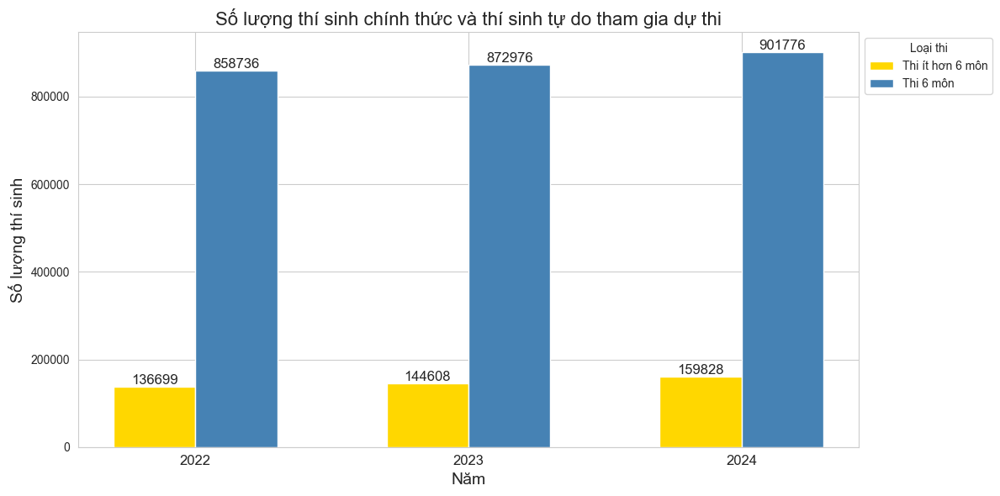

In [7]:
# Xử lý dữ liệu
not_null_2022 = df_2022[['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']].notna().sum(axis=1)
df_not_null_2022 = pd.DataFrame({
    'Số môn thi' : not_null_2022.value_counts().index,
    'Số lượng' : not_null_2022.value_counts().values,
})
df1 = pd.DataFrame({
    'Số môn thi': [' Thi 6 môn', ' Thi ít hơn 6 môn'],
    'Số lượng': [
        df_not_null_2022[df_not_null_2022['Số môn thi'] == 6]['Số lượng'].sum(),
        df_not_null_2022[df_not_null_2022['Số môn thi'] < 6]['Số lượng'].sum()
    ]
})

not_null_2023 = df_2023[['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']].notna().sum(axis=1)
df_not_null_2023 = pd.DataFrame({
    'Số môn thi' : not_null_2023.value_counts().index,
    'Số lượng' : not_null_2023.value_counts().values,
})
df2 = pd.DataFrame({
    'Số môn thi': [' Thi 6 môn', ' Thi ít hơn 6 môn'],
    'Số lượng': [
        df_not_null_2023[df_not_null_2023['Số môn thi'] == 6]['Số lượng'].sum(),
        df_not_null_2023[df_not_null_2023['Số môn thi'] < 6]['Số lượng'].sum()
    ]
})

not_null_2024 = df_2024[['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']].notna().sum(axis=1)
df_not_null_2024 = pd.DataFrame({
    'Số môn thi' : not_null_2024.value_counts().index,
    'Số lượng' : not_null_2024.value_counts().values,
})
df3 = pd.DataFrame({
    'Số môn thi': [' Thi 6 môn', ' Thi ít hơn 6 môn'],
    'Số lượng': [
        df_not_null_2024[df_not_null_2024['Số môn thi'] == 6]['Số lượng'].sum(),
        df_not_null_2024[df_not_null_2024['Số môn thi'] < 6]['Số lượng'].sum()
    ]
})

# Vẽ biểu đồ
df_bar = pd.DataFrame({
    'Năm': ['2022', '2023', '2024'],
    'Thi 6 môn': [df1['Số lượng'][0], df2['Số lượng'][0], df3['Số lượng'][0]],
    'Thi ít hơn 6 môn': [df1['Số lượng'][1], df2['Số lượng'][1], df3['Số lượng'][1]]
})

x = np.arange(len(df_bar['Năm']))
w = 0.3
fig, ax = plt.subplots(figsize=(12, 6))

bar1 = ax.bar(x - w/2, df_bar['Thi ít hơn 6 môn'], w, label='Thi ít hơn 6 môn', color='#FFD700')
bar2 = ax.bar(x + w/2, df_bar['Thi 6 môn'], w, label='Thi 6 môn', color='#4682B4')

ax.set_title("Số lượng thí sinh chính thức và thí sinh tự do tham gia dự thi", fontsize=16)
ax.set_xlabel("Năm", fontsize=14)
ax.set_ylabel("Số lượng thí sinh", fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(df_bar['Năm'], fontsize=12)
ax.legend(title='Loại thi', bbox_to_anchor=(1, 1), loc='upper left')

for bars in [bar1, bar2]:
    for bar in bars:
        res = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            res,
            f'{int(res)}',
            ha='center',
            va='bottom',
            fontsize=12
        )

plt.tight_layout()
plt.show()

Tỷ lệ tăng trưởng
                            mien  so_luong  2022->2023  2023->2024
0                   Bắc Trung Bộ    107583   -1.563259    2.061474
1         Duyên hải Nam Trung Bộ    108833    2.059313    1.949378
2  Trung du và miền núi phía Bắc    139757    2.299843    5.363268
3                     Tây Nguyên     64157    4.453798    2.188491
4                    Đông Nam Bộ    170786    2.192955    3.236375
5        Đồng bằng sông Cửu Long    163817    0.941699    3.893378
6            Đồng bằng sông Hồng    289667    4.300580    7.397836


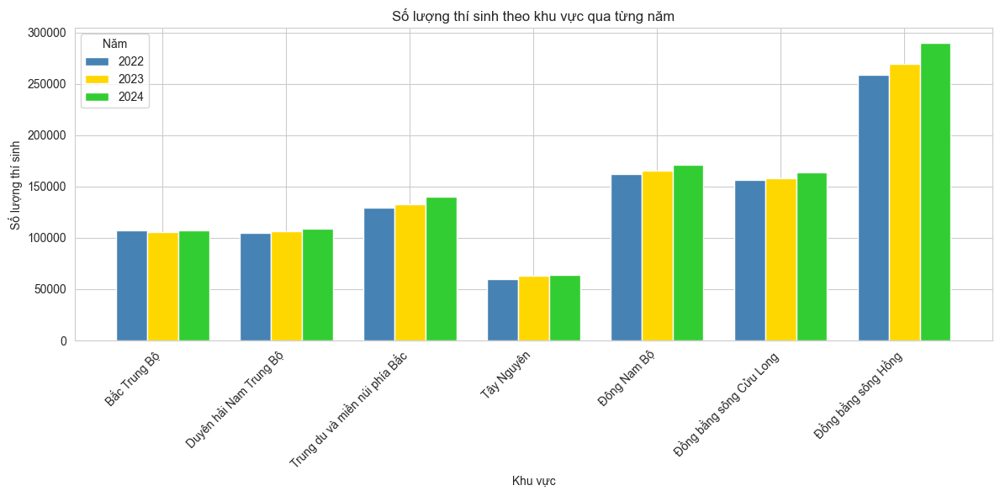

In [3]:
khu_vuc = {
    'Hà Nội': 'Đồng bằng sông Hồng',
    'TP. Hồ Chí Minh': 'Đông Nam Bộ',
    'Đà Nẵng': 'Duyên hải Nam Trung Bộ',
    'Cần Thơ': 'Đồng bằng sông Cửu Long',
    'Hải Phòng': 'Đồng bằng sông Hồng',
    'An Giang': 'Đồng bằng sông Cửu Long',
    'Bà Rịa - Vũng Tàu': 'Đông Nam Bộ',
    'Bắc Giang': 'Trung du và miền núi phía Bắc',
    'Bắc Kạn': 'Trung du và miền núi phía Bắc',
    'Bạc Liêu': 'Đồng bằng sông Cửu Long',
    'Bắc Ninh': 'Đồng bằng sông Hồng',
    'Bến Tre': 'Đồng bằng sông Cửu Long',
    'Bình Định': 'Duyên hải Nam Trung Bộ',
    'Bình Dương': 'Đông Nam Bộ',
    'Bình Phước': 'Đông Nam Bộ',
    'Bình Thuận': 'Duyên hải Nam Trung Bộ',
    'Cà Mau': 'Đồng bằng sông Cửu Long',
    'Cao Bằng': 'Trung du và miền núi phía Bắc',
    'Đăk Lăk': 'Tây Nguyên',
    'Đăk Nông': 'Tây Nguyên',
    'Điện Biên': 'Trung du và miền núi phía Bắc',
    'Đồng Nai': 'Đông Nam Bộ',
    'Đồng Tháp': 'Đồng bằng sông Cửu Long',
    'Gia Lai': 'Tây Nguyên',
    'Hà Giang': 'Trung du và miền núi phía Bắc',
    'Hà Nam': 'Đồng bằng sông Hồng',
    'Hải Dương': 'Đồng bằng sông Hồng',
    'Hòa Bình': 'Trung du và miền núi phía Bắc',
    'Hậu Giang': 'Đồng bằng sông Cửu Long',
    'Hưng Yên': 'Đồng bằng sông Hồng',
    'Khánh Hòa': 'Duyên hải Nam Trung Bộ',
    'Kiên Giang': 'Đồng bằng sông Cửu Long',
    'Kon Tum': 'Tây Nguyên',
    'Lai Châu': 'Trung du và miền núi phía Bắc',
    'Lâm Đồng': 'Tây Nguyên',
    'Lạng Sơn': 'Trung du và miền núi phía Bắc',
    'Lào Cai': 'Trung du và miền núi phía Bắc',
    'Long An': 'Đồng bằng sông Cửu Long',
    'Nam Định': 'Đồng bằng sông Hồng',
    'Nghệ An': 'Bắc Trung Bộ',
    'Ninh Bình': 'Đồng bằng sông Hồng',
    'Ninh Thuận': 'Duyên hải Nam Trung Bộ',
    'Phú Thọ': 'Trung du và miền núi phía Bắc',
    'Phú Yên': 'Duyên hải Nam Trung Bộ',
    'Quảng Bình': 'Bắc Trung Bộ',
    'Quảng Nam': 'Duyên hải Nam Trung Bộ',
    'Quảng Ngãi': 'Duyên hải Nam Trung Bộ',
    'Quảng Ninh': 'Đồng bằng sông Hồng',
    'Quảng Trị': 'Bắc Trung Bộ',
    'Sóc Trăng': 'Đồng bằng sông Cửu Long',
    'Sơn La': 'Trung du và miền núi phía Bắc',
    'Tây Ninh': 'Đông Nam Bộ',
    'Thái Bình': 'Đồng bằng sông Hồng',
    'Thái Nguyên': 'Trung du và miền núi phía Bắc',
    'Thanh Hóa': 'Bắc Trung Bộ',
    'Thừa Thiên Huế': 'Bắc Trung Bộ',
    'Tiền Giang': 'Đồng bằng sông Cửu Long',
    'Trà Vinh': 'Đồng bằng sông Cửu Long',
    'Tuyên Quang': 'Trung du và miền núi phía Bắc',
    'Vĩnh Long': 'Đồng bằng sông Cửu Long',
    'Vĩnh Phúc': 'Đồng bằng sông Hồng',
    'Yên Bái': 'Trung du và miền núi phía Bắc'
}

df_region = pd.DataFrame({'tinh_thanh' : khu_vuc.keys(), 'mien' : khu_vuc.values()})

re_2022 = df_2022['tinh_thi'].value_counts()
re_2023 = df_2023['tinh_thi'].value_counts()
re_2024 = df_2024['tinh_thi'].value_counts()


df_re_2022 = pd.DataFrame({'tinh_thanh': re_2022.index, 'so_luong': re_2022.values})
df_re_2022 = df_re_2022.merge(df_region, on='tinh_thanh', how='inner')
df_re_2022 = df_re_2022.groupby('mien')['so_luong'].sum().reset_index()

df_re_2023 = pd.DataFrame({'tinh_thanh': re_2023.index, 'so_luong': re_2023.values})
df_re_2023 = df_re_2023.merge(df_region, on='tinh_thanh', how='inner')
df_re_2023 = df_re_2023.groupby('mien')['so_luong'].sum().reset_index()

df_re_2024 = pd.DataFrame({'tinh_thanh': re_2024.index, 'so_luong': re_2024.values})
df_re_2024 = df_re_2024.merge(df_region, on='tinh_thanh', how='inner')
df_re_2024 = df_re_2024.groupby('mien')['so_luong'].sum().reset_index()

# tính tỉ lệ tăng trưởng từng vùng
print("Tỷ lệ tăng trưởng")
df_tang_truong = df_re_2024.copy()
df_tang_truong['2022->2023'] = ((df_re_2023['so_luong'] - df_re_2022['so_luong']) / df_re_2022['so_luong']) * 100
df_tang_truong['2023->2024'] = ((df_re_2024['so_luong'] - df_re_2023['so_luong']) / df_re_2023['so_luong']) * 100
print(df_tang_truong)

x = np.arange(len(df_re_2024['mien']))
w = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - w, df_re_2022['so_luong'], w, label='2022', color='#4682B4')
ax.bar(x, df_re_2023['so_luong'], w, label='2023', color='#FFD700')
ax.bar(x + w, df_re_2024['so_luong'], w, label='2024', color='#32CD32')
ax.set_title("Số lượng thí sinh theo khu vực qua từng năm")
ax.set_xlabel("Khu vực")
ax.set_ylabel("Số lượng thí sinh")
ax.set_xticks(x)
ax.set_xticklabels(df_re_2024['mien'], rotation=45, ha='right')
ax.legend(title="Năm")

plt.tight_layout()
plt.show()


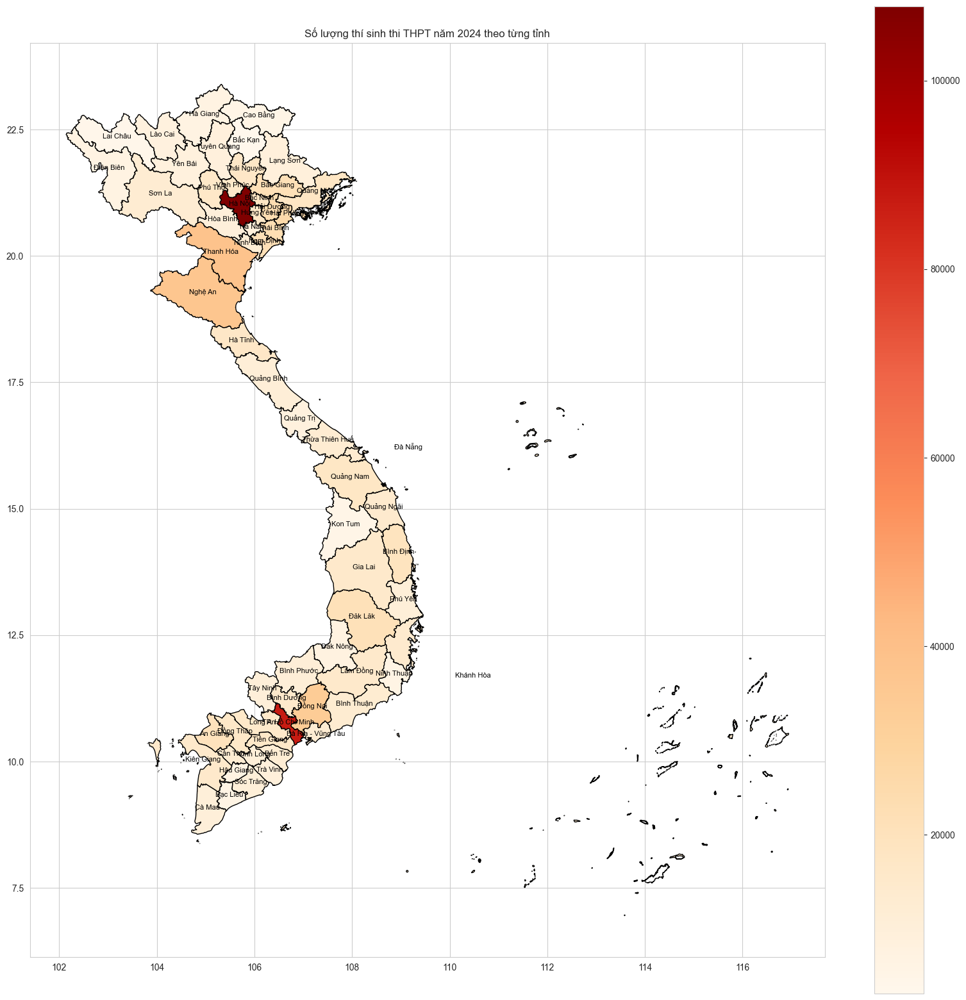

In [9]:
soluong_2024 = df_2024['tinh_thi'].value_counts()
df_soluong2024 = pd.DataFrame({
    'Tỉnh thi': soluong_2024.index,
    'Số lượng': soluong_2024.values
})
# Đồng bộ dữ liệu trong dataframe với bản đồ
g2024 = gdf.merge(df_soluong2024, left_on='ten_tinh', right_on='Tỉnh thi', how='inner')
# Vẽ biểu đồ
fig, ax = plt.subplots(figsize=(20, 20))
g2024.plot(column='Số lượng', ax=ax, cmap='OrRd', edgecolor='black', legend=True)
# Thêm tên từng tỉnh
for idx, r in gdf.iterrows():
    x, y = r['geometry'].centroid.x, r['geometry'].centroid.y
    ax.text(x, y, r['ten_tinh'], fontsize=8, ha='center', color='black')
# Tiêu đề
ax.set_title('Số lượng thí sinh thi THPT năm 2024 theo từng tỉnh')
plt.show()

# Phân tích điểm các môn

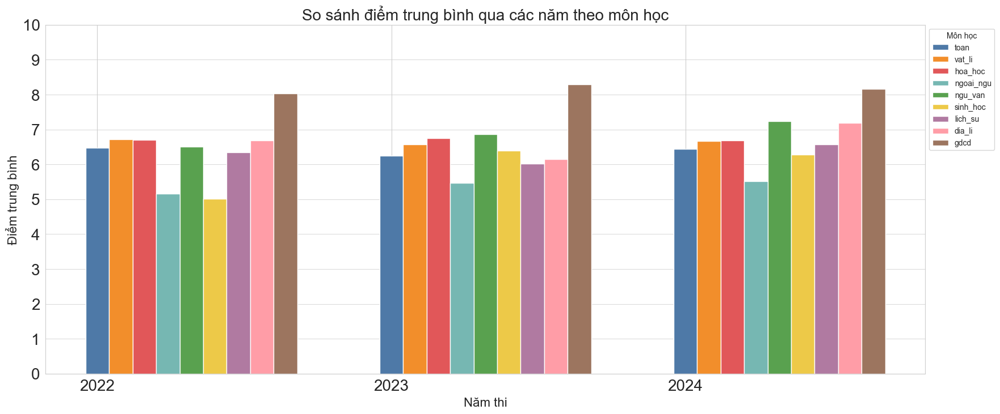

In [10]:
# OverView về điểm trung bình từng môn qua các năm
mon_hoc = ['toan','vat_li','hoa_hoc','ngoai_ngu','ngu_van','sinh_hoc','lich_su','dia_li','gdcd']
# tạo hàm tính trung bình tất cả 9 môn thi
def diem_tb(df) :
    df_diemtb = df[mon_hoc].mean()
    return df_diemtb

tb_2022 = diem_tb(df_2022)
tb_2023 = diem_tb(df_2023)
tb_2024 = diem_tb(df_2024)

df_tb_2022 = pd.DataFrame({'Môn học' : tb_2022.index, 'Điểm Tbinh' : tb_2022.values, 'Năm' : 2022})
df_tb_2023 = pd.DataFrame({'Môn học' : tb_2023.index, 'Điểm Tbinh' : tb_2023.values, 'Năm' : 2023})
df_tb_2024 = pd.DataFrame({'Môn học' : tb_2024.index, 'Điểm Tbinh' : tb_2024.values, 'Năm' : 2024})
df_tb_all = pd.concat([df_tb_2022 , df_tb_2023 , df_tb_2024 ], ignore_index=True)

colors = [ "#4E79A7", "#F28E2B", "#E15759", "#76B7B2", "#59A14F", "#EDC948", "#B07AA1", "#FF9DA7", "#9C755F"]
# vẽ biểu đồ
plt.figure(figsize = (20,8))
for i,(s,color) in enumerate(zip(mon_hoc,colors)) :
    plt.bar(
        df_tb_all.loc[df_tb_all['Môn học'] == s, 'Năm'] + i * 0.08,
        df_tb_all.loc[df_tb_all['Môn học'] == s, 'Điểm Tbinh'],
        width = 0.08,
        label = s,
        color = color )
plt.xticks([2022,2023,2024], size = 20)
plt.yticks(np.arange(0,11), size = 20)
plt.xlabel('Năm thi', size = 16)
plt.ylabel('Điểm trung bình', size = 16)
plt.title('So sánh điểm trung bình qua các năm theo môn học', size = 20)
plt.legend(title='Môn học', bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.show()

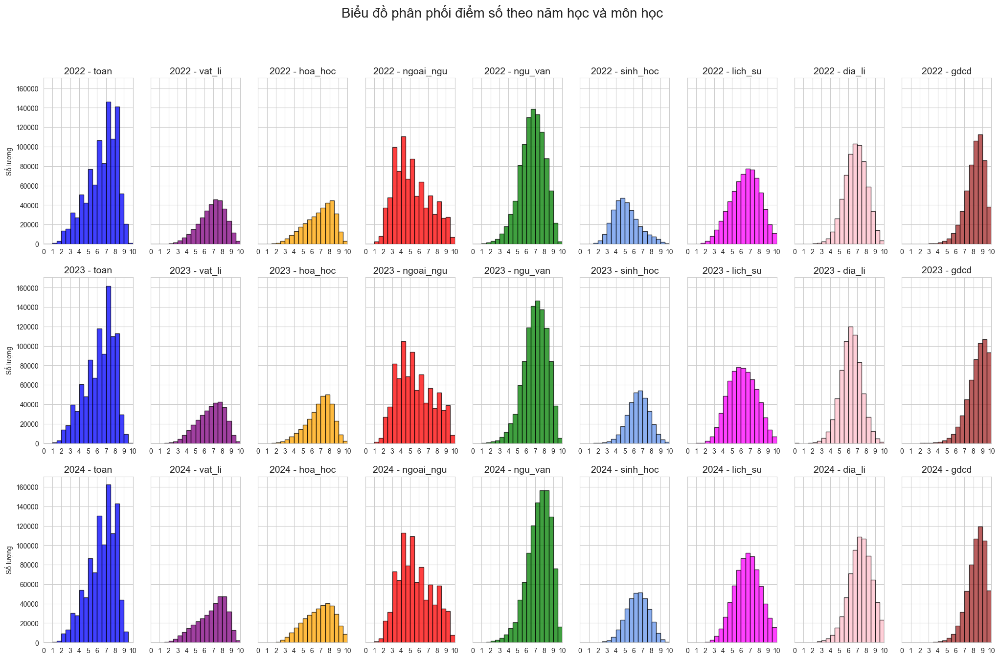

In [11]:
nam_hoc = [2022, 2023, 2024]
mau_mon_hoc = {
    'toan': 'blue',
    'ngu_van': 'green',
    'ngoai_ngu': 'red',
    'vat_li': 'purple',
    'hoa_hoc': 'orange',
    'sinh_hoc': 'cornflowerblue',
    'lich_su': 'magenta',
    'dia_li': 'pink',
    'gdcd': 'brown'
}
# vẽ biểu dồ
fig, axes = plt.subplots(len(nam_hoc), len(mon_hoc), figsize=(25, 15), sharey=True)
fig.suptitle('Biểu đồ phân phối điểm số theo năm học và môn học',size = 20)

for i, nam in enumerate(nam_hoc):
    for j, mon in enumerate(mon_hoc):
        du_lieu_theo_nam = df_all[df_all['nam_thi'] == nam]
        diem_mon_hoc = du_lieu_theo_nam[mon]
        mau = mau_mon_hoc[mon]
        ax = axes[i, j]
        ax.hist(
            diem_mon_hoc,
            bins=20,
            range=(0, 10),
            alpha=0.75,
            color=mau,
            edgecolor='black'
        )

        ax.set_title(f"{nam} - {mon}", fontsize=14)
        ax.set_xlim(0, 10)
        ax.set_xticks(range(0, 11))
        if j == 0:
            ax.set_ylabel('Số lượng')

plt.show()


# Môn Toán

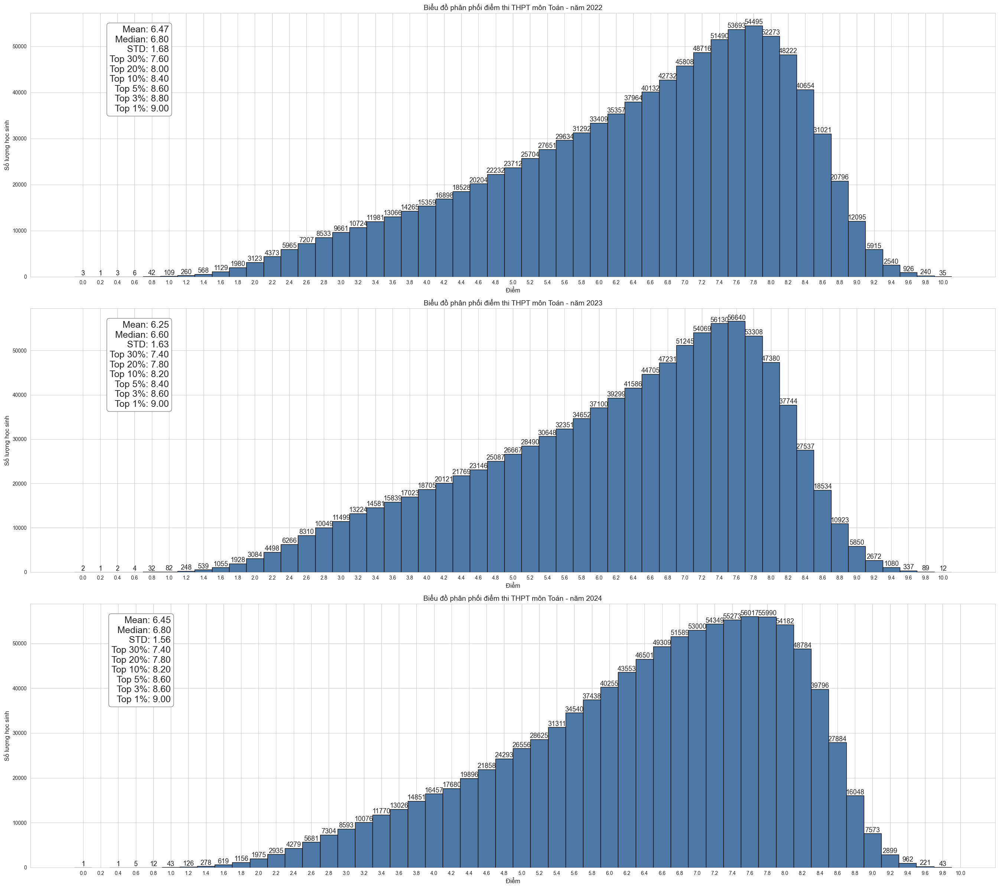

In [12]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))
# Thiết lập bảng số liệu
for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['toan'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100 - p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{k}: {val:.2f}" for k, val in percentiles.items()])
    )
# Vẽ biểu đồ
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#4E79A7', width=0.2)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Toán - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.2 for i in range(51)])

plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Toán là : 1045613


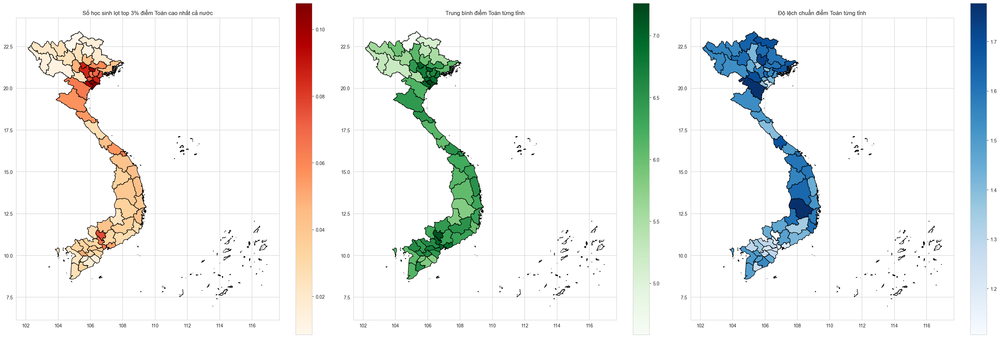

In [13]:
# Tính tổng số thí sinh thi môn toán
toan = df_2024[['toan','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Toán là : '+ str(len(toan)))

# tính tỉ lệ thí sinh lọt top 3% từng tỉnh và hợp với bản đồ
tong = toan['tinh_thi'].value_counts()
top3= toan[toan['toan'] >= toan['toan'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp vào dữ liệu bản đồ
mean_toan = toan.groupby('tinh_thi')['toan'].mean().reset_index()
mean_toan.columns = ['Tỉnh thi', 'Trung bình điểm Toán']
gdf_mean = gdf.merge(mean_toan, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn từng tỉnh và hợp với dữ liệu biểu đồ
std_toan = toan.groupby('tinh_thi')['toan'].std().reset_index()
std_toan.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Toán']
gdf_std = gdf.merge(std_toan, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# Biểu đồ 1: Top 3% điểm Toán
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Toán cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm Toán
gdf_mean.plot(
    column='Trung bình điểm Toán',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Toán từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm Toán
gdf_std.plot(
    column='Độ lệch chuẩn điểm Toán',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Toán từng tỉnh')
plt.tight_layout()
plt.show()


# Môn Vật lý

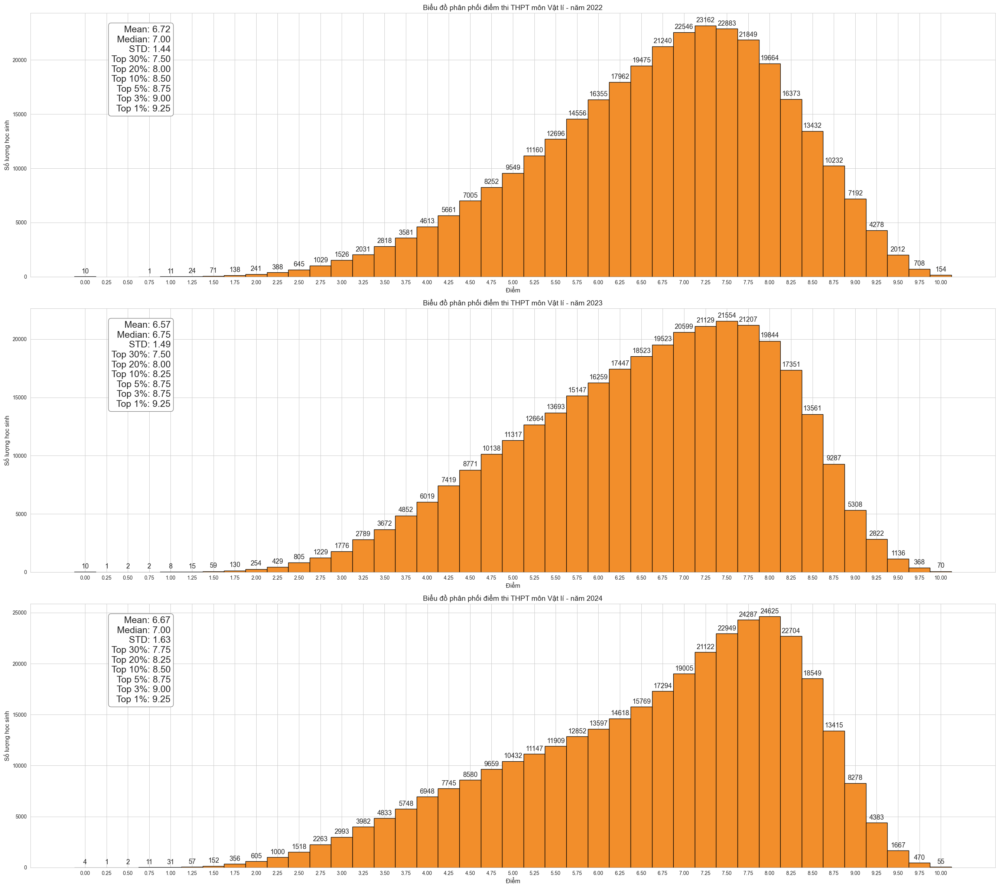

In [14]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['vat_li'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100 - p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{k}: {val:.2f}" for k, val in percentiles.items()])
    )

    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#F28E2B', width=0.25)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Vật lí - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.25 for i in range(41)])

plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Vật lí là : 345615


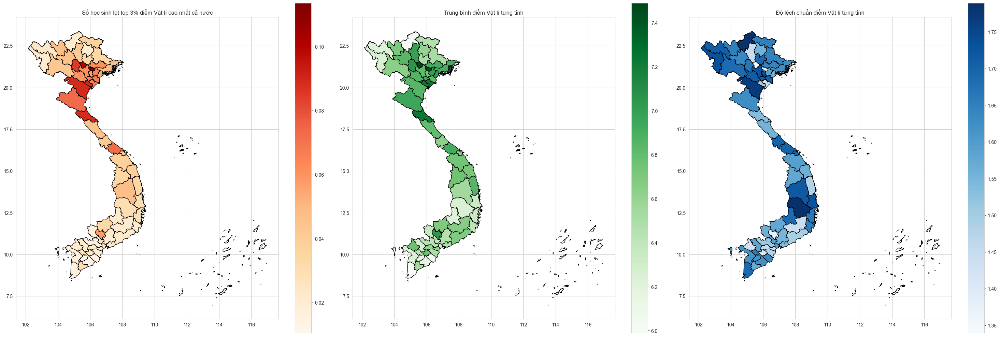

In [15]:
# Tổng số thí sinh thi Lí
vat_li = df_2024[['vat_li','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Vật lí là : '+ str(len(vat_li)))
# tính tỉ lệ thí sinh lọt top 3% từng tỉnh và hợp với bản đồ
tong = vat_li['tinh_thi'].value_counts()
top3= vat_li[vat_li['vat_li'] >= vat_li['vat_li'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# # tính điểm trung bình từng tỉnh và hợp vào dữ liệu bản đồ
mean_vat_li = vat_li.groupby('tinh_thi')['vat_li'].mean().reset_index()
mean_vat_li.columns = ['Tỉnh thi', 'Trung bình điểm Vật lí']
gdf_mean = gdf.merge(mean_vat_li, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn từng tỉnh và hợp với dữ liệu bản đồ
std_vat_li = vat_li.groupby('tinh_thi')['vat_li'].std().reset_index()
std_vat_li.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Vật lí']
gdf_std = gdf.merge(std_vat_li, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# Thiết lập kích thước và bố cục
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Biểu đồ 1: Top 3% điểm lí
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Vật lí cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm lí
gdf_mean.plot(
    column='Trung bình điểm Vật lí',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Vật lí từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm lí
gdf_std.plot(
    column='Độ lệch chuẩn điểm Vật lí',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Vật lí từng tỉnh')
plt.tight_layout()
plt.show()


# Môn Hóa học

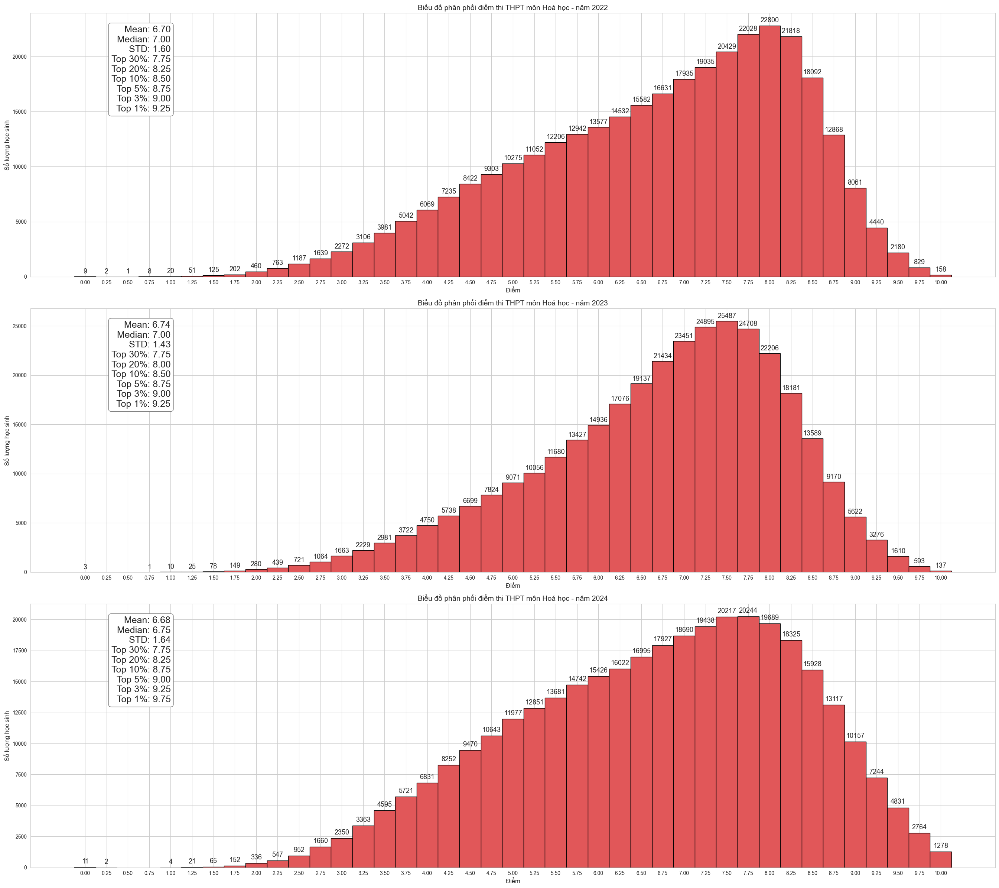

In [16]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['hoa_hoc'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100 - p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{k}: {val:.2f}" for k, val in percentiles.items()])
    )

    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#E15759', width=0.25)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Hoá học - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.25 for i in range(41)])

plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Hoá học là : 346518


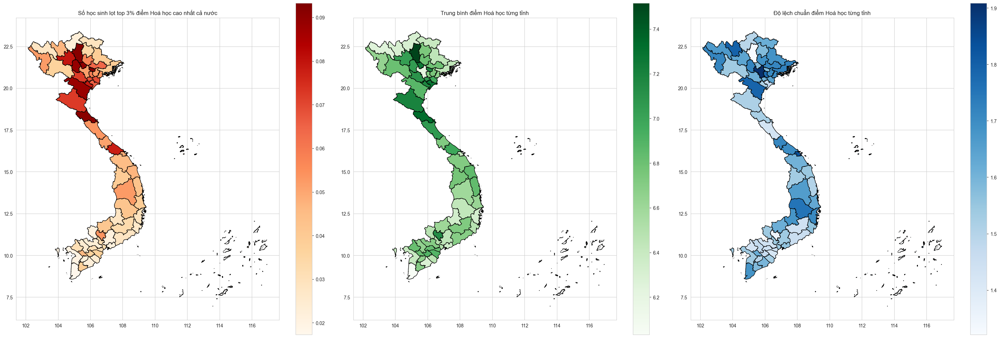

In [17]:
# tính tổng số thí sinh thi môn hóa
hoa_hoc = df_2024[['hoa_hoc','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Hoá học là : '+ str(len(hoa_hoc)))
# tính tỉ lệ thí sinh lọt top 3% từng tỉnh và hợp với bản đồ
tong = hoa_hoc['tinh_thi'].value_counts()
top3= hoa_hoc[hoa_hoc['hoa_hoc'] >= hoa_hoc['hoa_hoc'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp vào dữ liệu bản đồ
mean_hoa_hoc = hoa_hoc.groupby('tinh_thi')['hoa_hoc'].mean().reset_index()
mean_hoa_hoc.columns = ['Tỉnh thi', 'Trung bình điểm Hoá học']
gdf_mean = gdf.merge(mean_hoa_hoc, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn từng tỉnh và hợp với dữ liệu bản đồ
std_hoa_hoc = hoa_hoc.groupby('tinh_thi')['hoa_hoc'].std().reset_index()
std_hoa_hoc.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Hoá học']
gdf_std = gdf.merge(std_hoa_hoc, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# Biểu đồ 1: Top 3% điểm Hóa
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Hoá học cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm Hóa
gdf_mean.plot(
    column='Trung bình điểm Hoá học',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Hoá học từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm Hóa
gdf_std.plot(
    column='Độ lệch chuẩn điểm Hoá học',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Hoá học từng tỉnh')
plt.tight_layout()
plt.show()


# Môn Sinh học

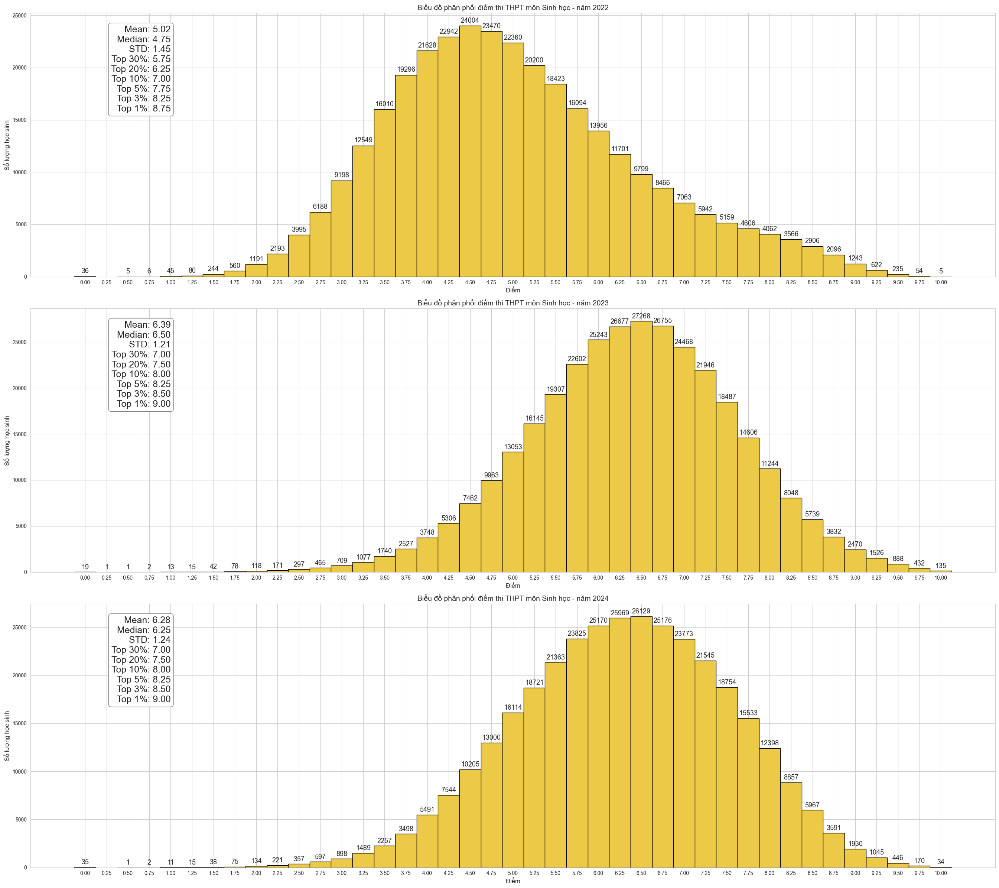

In [18]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['sinh_hoc'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100 - p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{k}: {val:.2f}" for k, val in percentiles.items()])
    )

    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#EDC948', width=0.25)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Sinh học - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center', fontsize=13)

    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.25 for i in range(41)])

plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Sinh học là : 342378


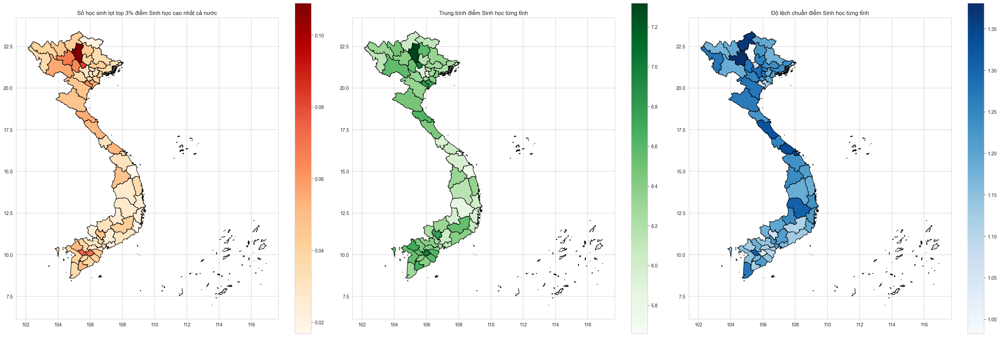

In [19]:
# tính tổng số học sinh thi môn sinh
sinh_hoc = df_2024[['sinh_hoc','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Sinh học là : '+ str(len(sinh_hoc)))
#tính điểm lọt top 3% và hợp với bản đồ
tong = sinh_hoc['tinh_thi'].value_counts()
top3= sinh_hoc[sinh_hoc['sinh_hoc'] >= sinh_hoc['sinh_hoc'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp vào dữ liệu bản đồ
mean_sinh_hoc = sinh_hoc.groupby('tinh_thi')['sinh_hoc'].mean().reset_index()
mean_sinh_hoc.columns = ['Tỉnh thi', 'Trung bình điểm Sinh học']
gdf_mean = gdf.merge(mean_sinh_hoc, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn từng tỉnh và hợp với dữ liệu bản đồ
std_sinh_hoc = sinh_hoc.groupby('tinh_thi')['sinh_hoc'].std().reset_index()
std_sinh_hoc.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Sinh học']
gdf_std = gdf.merge(std_sinh_hoc, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# Biểu đồ 1: Top 3% điểm sinh học
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Sinh học cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm sinh học
gdf_mean.plot(
    column='Trung bình điểm Sinh học',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Sinh học từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm sinh học
gdf_std.plot(
    column='Độ lệch chuẩn điểm Sinh học',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Sinh học từng tỉnh')

plt.tight_layout()
plt.show()


# Môn Ngoại ngữ

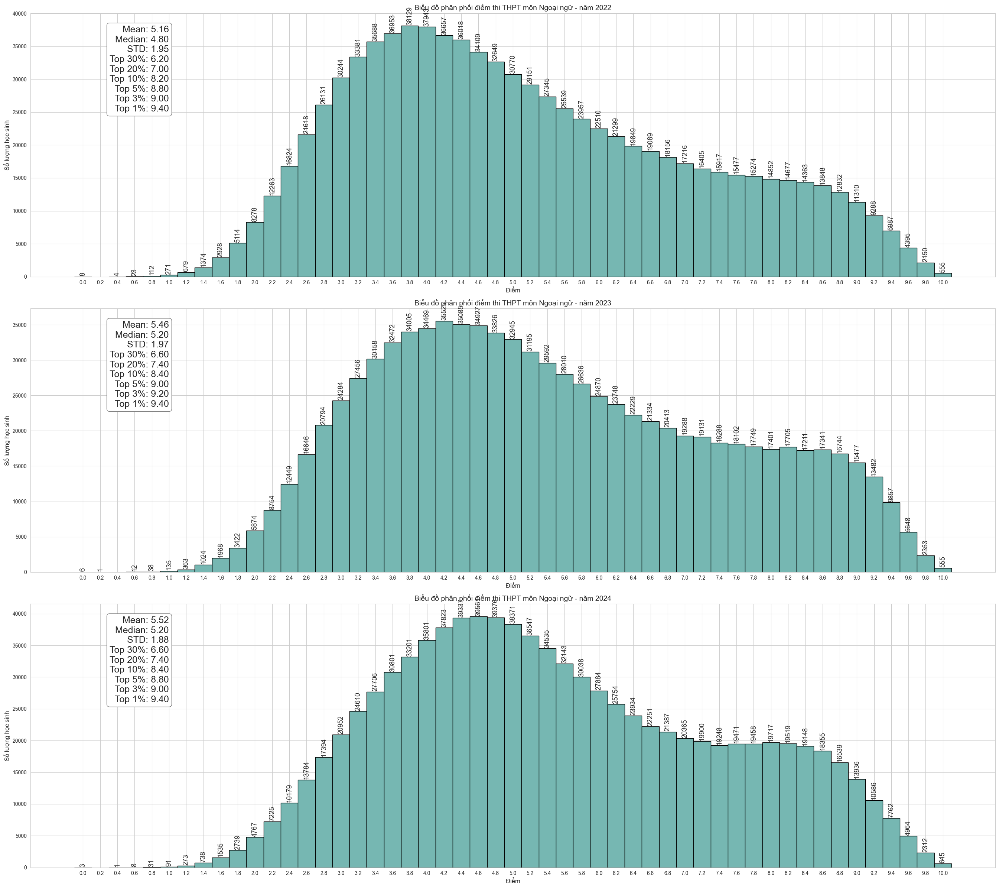

In [20]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

# Vẽ biểu đồ và tính toán các thống kê
plt.figure(figsize=(27,24))
for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['ngoai_ngu'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100-p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }

    # Tạo thông tin để hiển thị
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )
    # Vẽ biểu đồ cột
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#76B7B2', width=0.2)

    # Đặt tiêu đề và nhãn
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Ngoại ngữ - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)

    # Thêm giá trị vào các thanh cột
    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center',rotation=90, fontsize=13)

    # Hiển thị các thống kê trên biểu đồ
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    # Đặt các mốc trên trục x
    plt.xticks([i * 0.2 for i in range(51)])

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Ngoại ngữ năm 2024 là : 912705


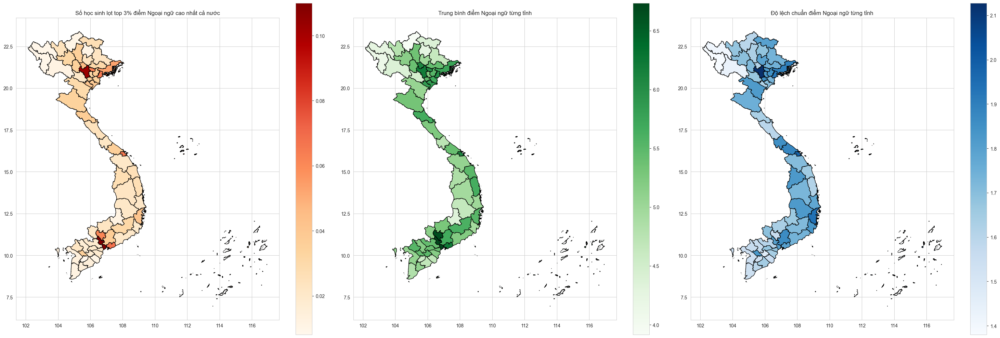

In [21]:
# tính số học sinh thi môn Ngoại ngữ
ngoai_ngu = df_2024[['ngoai_ngu','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Ngoại ngữ năm 2024 là : '+ str(len(ngoai_ngu)))

#tính điểm lọt top 3% và hợp với bản đồ
tong = ngoai_ngu['tinh_thi'].value_counts()
top3= ngoai_ngu[ngoai_ngu['ngoai_ngu'] >= ngoai_ngu['ngoai_ngu'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp với dữ liệu bản đồ
mean_ngoai_ngu = ngoai_ngu.groupby('tinh_thi')['ngoai_ngu'].mean().reset_index()
mean_ngoai_ngu.columns = ['Tỉnh thi', 'Trung bình điểm Ngoại ngữ']
gdf_mean = gdf.merge(mean_ngoai_ngu, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn từng tỉnh và hợp với dữ liệu bản đồ
std_ngoai_ngu = ngoai_ngu.groupby('tinh_thi')['ngoai_ngu'].std().reset_index()
std_ngoai_ngu.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Ngoại ngữ']
gdf_std = gdf.merge(std_ngoai_ngu, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# Thiết lập kích thước và bố cục
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Biểu đồ 1: Top 3% điểm Ngoại ngữ
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Ngoại ngữ cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm Ngoại ngữ
gdf_mean.plot(
    column='Trung bình điểm Ngoại ngữ',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Ngoại ngữ từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm Ngoại ngữ
gdf_std.plot(
    column='Độ lệch chuẩn điểm Ngoại ngữ',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Ngoại ngữ từng tỉnh')

# Tùy chỉnh và hiển thị
plt.tight_layout()
plt.show()


# Môn Ngữ văn

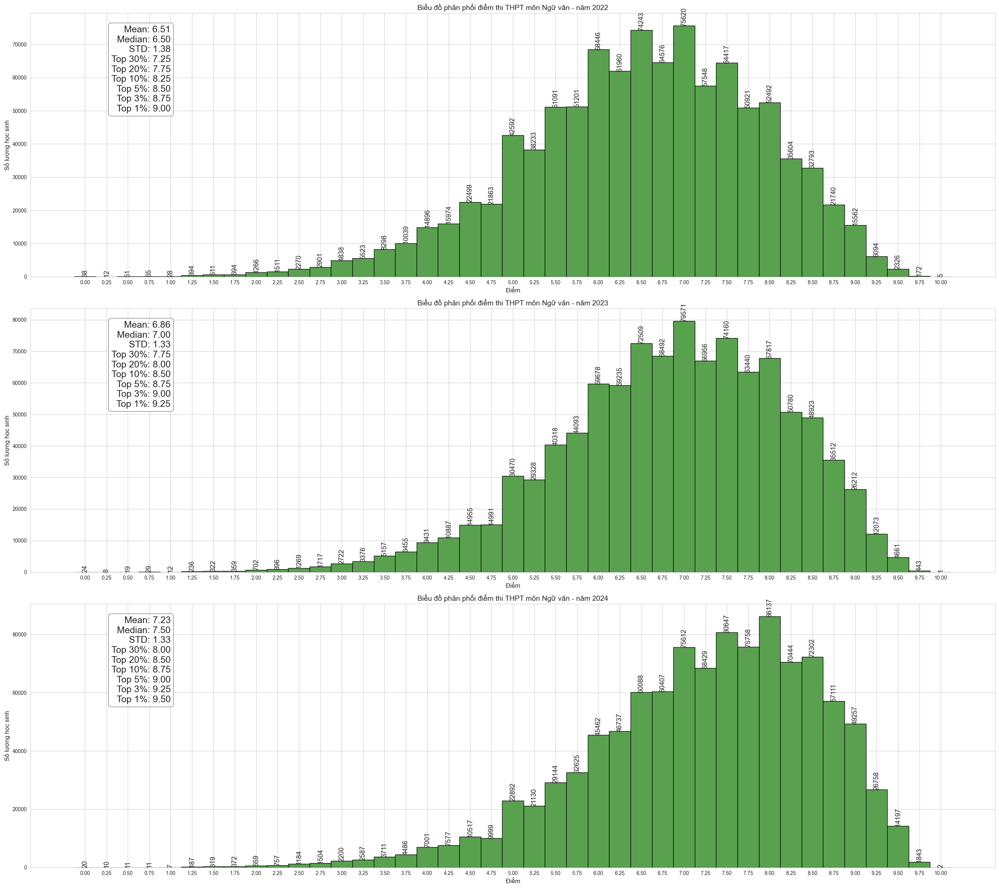

In [22]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

# Vẽ biểu đồ và tính toán các thống kê
plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['ngu_van'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100-p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    # Tạo thông tin để hiển thị
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )
    # Vẽ biểu đồ cột
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#59A14F', width=0.25)
    # Đặt tiêu đề và nhãn
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Ngữ văn - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)
    # Thêm giá trị vào các thanh cột
    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center',rotation=90, fontsize=13)
    # Hiển thị các thống kê trên biểu đồ
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )
    # Đặt các mốc trên trục x
    plt.xticks([i * 0.25 for i in range(41)])

plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Ngữ văn là : 1050101


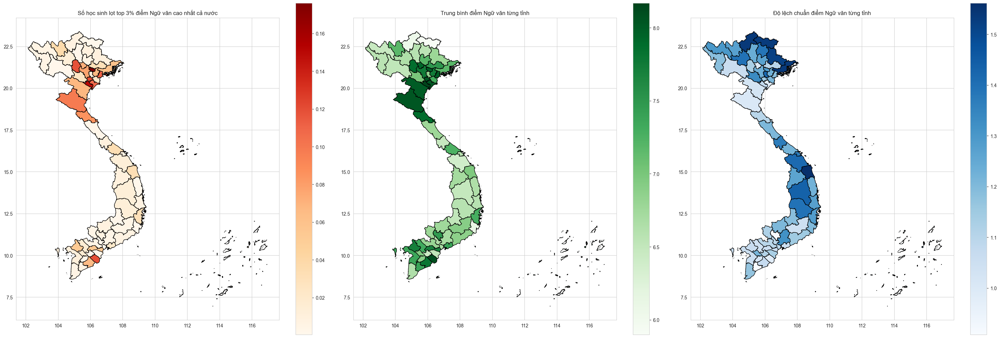

In [23]:
# tính tổng số thí sinh thi môn văn
ngu_van = df_2024[['ngu_van','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Ngữ văn là : '+ str(len(ngu_van)))
# tính điểm lọt top 3% và hợp với dữ liệu bản đồ
tong = ngu_van['tinh_thi'].value_counts()
top3= ngu_van[ngu_van['ngu_van'] >= ngu_van['ngu_van'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp với dữ liệu bản đồ
mean_ngu_van = ngu_van.groupby('tinh_thi')['ngu_van'].mean().reset_index()
mean_ngu_van.columns = ['Tỉnh thi', 'Trung bình điểm Ngữ văn']
gdf_mean = gdf.merge(mean_ngu_van, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn tưng tỉnh rồi hợp với dữ liệu bản đồ
std_ngu_van = ngu_van.groupby('tinh_thi')['ngu_van'].std().reset_index()
std_ngu_van.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Ngữ văn']
gdf_std = gdf.merge(std_ngu_van, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Biểu đồ 1: Top 3% điểm Ngữ văn
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Ngữ văn cao nhất cả nước')

gdf_mean.plot(
    column='Trung bình điểm Ngữ văn',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Ngữ văn từng tỉnh')

gdf_std.plot(
    column='Độ lệch chuẩn điểm Ngữ văn',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Ngữ văn từng tỉnh')

plt.tight_layout()
plt.show()


# Môn Lịch sử

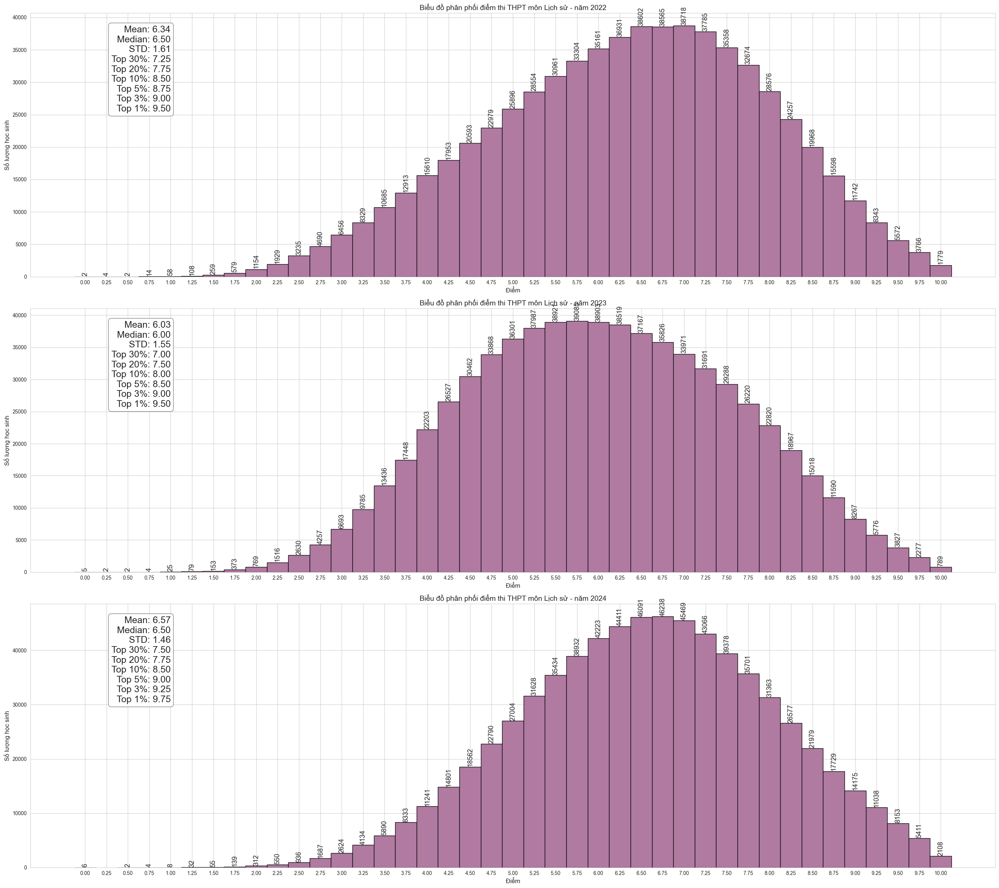

In [24]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['lich_su'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100-p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )
    # Vẽ biểu đồ cột
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#B07AA1', width=0.25)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Lịch sử - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)
    # Thêm giá trị vào các thanh cột
    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center',rotation=90, fontsize=13)
    # Hiển thị các thống kê trên biểu đồ
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )
    # Đặt các mốc trên trục x
    plt.xticks([i * 0.25 for i in range(41)])
plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Lịch sử là : 706214


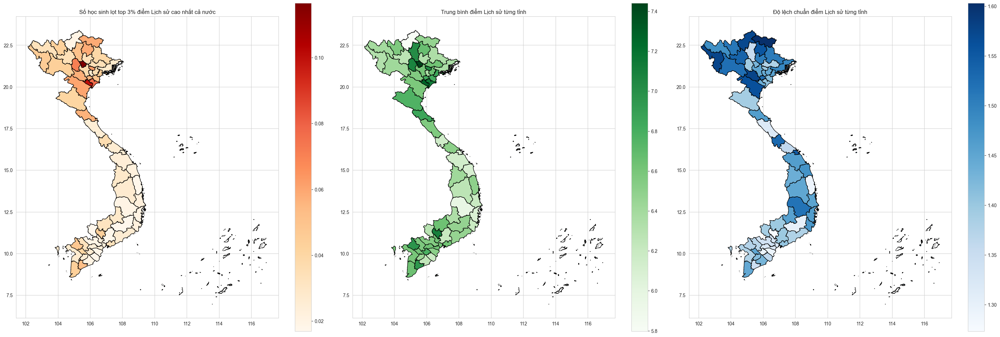

In [25]:
# Tính tổng số thí sinh thi môn Sử
lich_su = df_2024[['lich_su','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Lịch sử là : '+ str(len(lich_su)))

# tính tỉ lệ thí sinh lọt top 3% từng tỉnh và hợp với bản đồ
tong = lich_su['tinh_thi'].value_counts()
top3= lich_su[lich_su['lich_su'] >= lich_su['lich_su'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp với dữ liệu bản đồ
mean_lich_su = lich_su.groupby('tinh_thi')['lich_su'].mean().reset_index()
mean_lich_su.columns = ['Tỉnh thi', 'Trung bình điểm Lịch sử']
gdf_mean = gdf.merge(mean_lich_su, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn từng tỉnh và hợp với dữ liệu bản đồ
std_lich_su = lich_su.groupby('tinh_thi')['lich_su'].std().reset_index()
std_lich_su.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Lịch sử']
gdf_std = gdf.merge(std_lich_su, left_on='ten_tinh', right_on='Tỉnh thi', how='left')


fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# Biểu đồ 1: Top 3% điểm lịch sử
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Lịch sử cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm lịch sử
gdf_mean.plot(
    column='Trung bình điểm Lịch sử',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Lịch sử từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm lịch sử
gdf_std.plot(
    column='Độ lệch chuẩn điểm Lịch sử',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Lịch sử từng tỉnh')

plt.tight_layout()
plt.show()


# Môn Địa lí

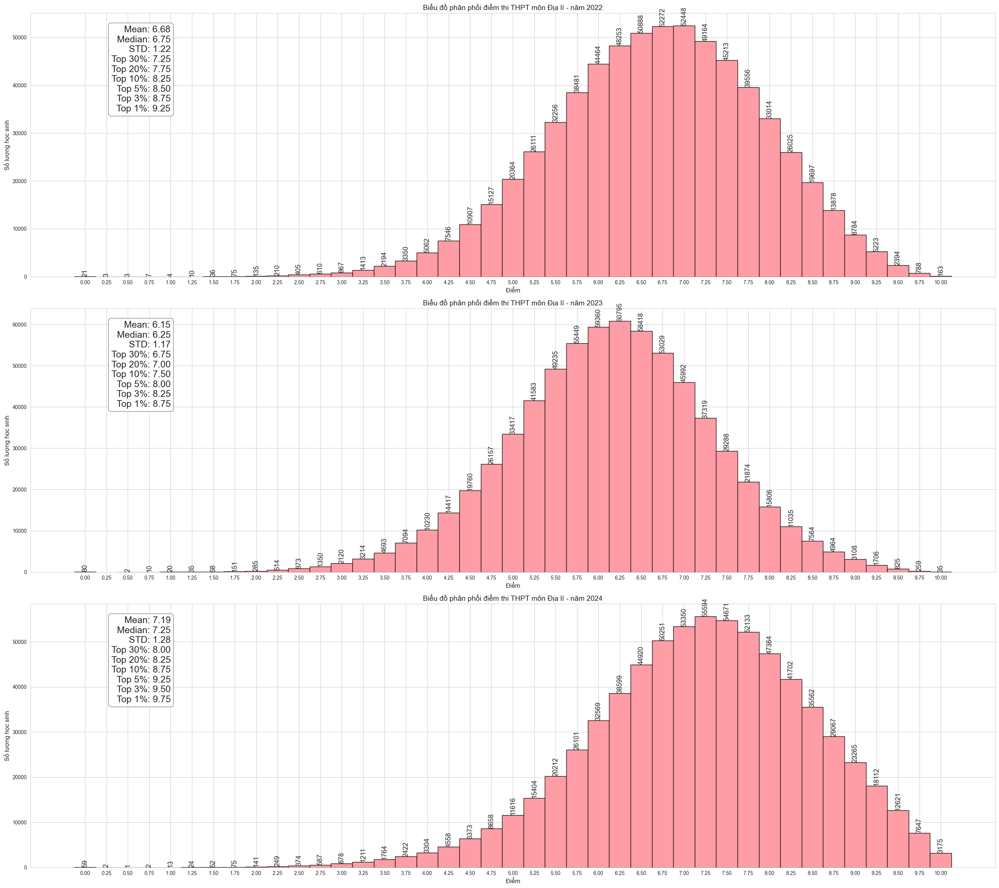

In [26]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]

# Vẽ biểu đồ và tính toán các thống kê
plt.figure(figsize=(27,24))

for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['dia_li'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100-p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )
    # Vẽ biểu đồ cột
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#FF9DA7', width=0.25)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn Địa lí - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)
    # Thêm giá trị vào các thanh cột
    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center',rotation=90, fontsize=13)
    # Hiển thị các thống kê trên biểu đồ
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )
    plt.xticks([i * 0.25 for i in range(41)])
plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Địa lí là : 704682


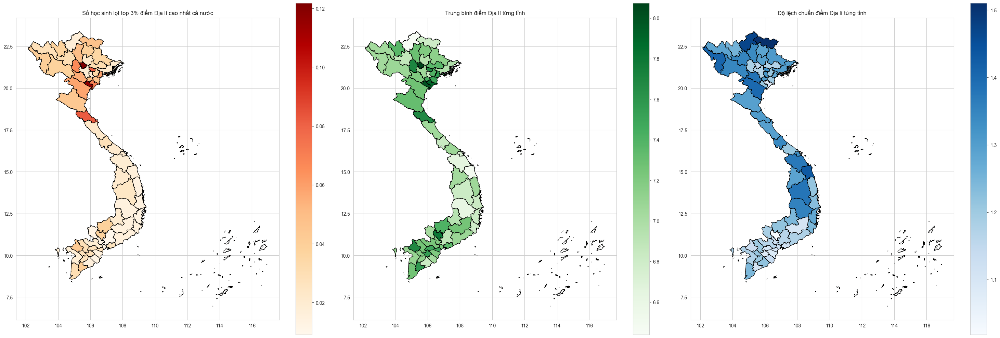

In [27]:
# tính tổng số học sinh thi môn địa lý
dia_li = df_2024[['dia_li','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Địa lí là : '+ str(len(dia_li)))

# tính tỉ lệ thí sinh lọt top 3% từng tỉnh và hợp với bản đồ
tong = dia_li['tinh_thi'].value_counts()
top3= dia_li[dia_li['dia_li'] >= dia_li['dia_li'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tỉnh và hợp với dữ liệu bản đồ
mean_dia_li = dia_li.groupby('tinh_thi')['dia_li'].mean().reset_index()
mean_dia_li.columns = ['Tỉnh thi', 'Trung bình điểm Địa lí']
gdf_mean = gdf.merge(mean_dia_li, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính độ lệch chuẩn và hợp với dữ liệu bản đồ
std_dia_li = dia_li.groupby('tinh_thi')['dia_li'].std().reset_index()
std_dia_li.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Địa lí']
gdf_std = gdf.merge(std_dia_li, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# Biểu đồ 1: Top 3% điểm địa lý
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Địa lí cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm địa lý
gdf_mean.plot(
    column='Trung bình điểm Địa lí',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Địa lí từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm địa lý
gdf_std.plot(
    column='Độ lệch chuẩn điểm Địa lí',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Địa lí từng tỉnh')

plt.tight_layout()
plt.show()


# Môn Giáo dục công dân

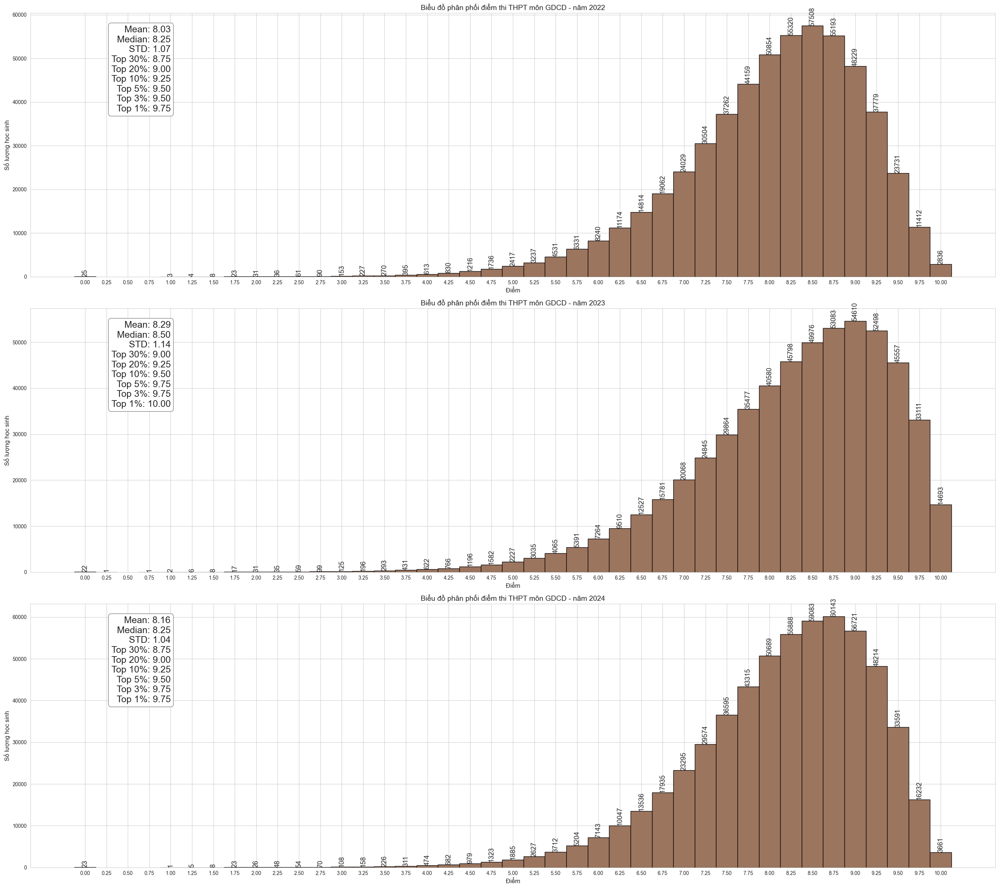

In [28]:
df = [df_2022, df_2023, df_2024]
years = [2022, 2023, 2024]
# Vẽ biểu đồ và tính toán các thống kê
plt.figure(figsize=(27,24))
for i, (df, year) in enumerate(zip(df, years)):
    diem_thi = df['gdcd'].dropna()
    a = diem_thi.value_counts().sort_index()
    mean = diem_thi.mean()
    median = diem_thi.median()
    std = diem_thi.std()
    percentiles = {
        f"Top {100-p}%": np.percentile(diem_thi, p) for p in [70, 80, 90, 95, 97, 99]
    }
    stats_text = (
        f"Mean: {mean:.2f}\n"
        f"Median: {median:.2f}\n"
        f"STD: {std:.2f}\n"
        + "\n".join([f"{key}: {value:.2f}" for key, value in percentiles.items()])
    )
    plt.subplot(3, 1, i + 1)
    plt.bar(x=a.index, height=a.values, edgecolor='black', color='#9C755F', width=0.25)
    plt.title(f'Biểu đồ phân phối điểm thi THPT môn GDCD - năm {year}', fontsize=14)
    plt.xlabel('Điểm', fontsize=12)
    plt.ylabel('Số lượng học sinh', fontsize=12)
    for j in range(len(a)):
        plt.text(a.index[j], a.values[j] + 300, str(a.values[j]), ha='center',rotation=90, fontsize=13)
    plt.text(
        1, max(a.values) * 1, stats_text, fontsize=18,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle="round", facecolor="white", edgecolor="gray")
    )

    plt.xticks([i * 0.25 for i in range(41)])

plt.tight_layout()
plt.show()


Tổng số thí sinh thi môn Giáo dục công dân là : 583609


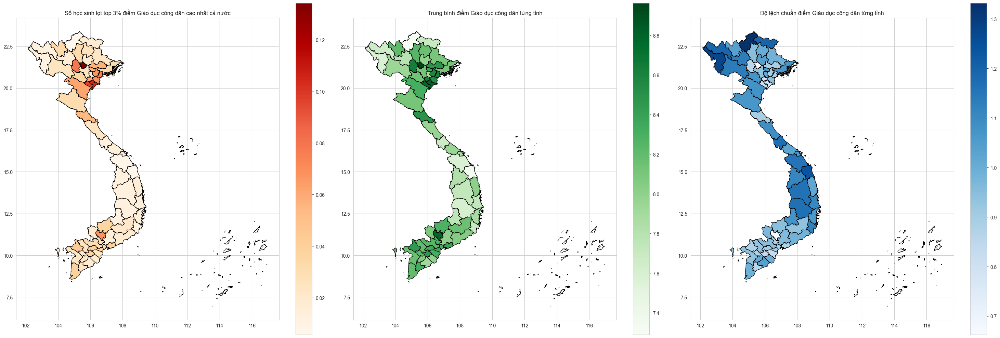

In [29]:
# Tính tổng số thi sinh thi môn GDCD
gdcd = df_2024[['gdcd','tinh_thi']].dropna()
print('Tổng số thí sinh thi môn Giáo dục công dân là : '+ str(len(gdcd)))

# tính tỉ lệ thí sinh lọt top 3% từng tỉnh và hợp với bản đồ
tong = gdcd['tinh_thi'].value_counts()
top3= gdcd[gdcd['gdcd'] >= gdcd['gdcd'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi' : Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# tính điểm trung bình từng tình và hợp dữ liệu vản bản đồ
mean_gdcd = gdcd.groupby('tinh_thi')['gdcd'].mean().reset_index()
mean_gdcd.columns = ['Tỉnh thi', 'Trung bình điểm Giáo dục công dân']
gdf_mean = gdf.merge(mean_gdcd, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

#Tính độ lệch chuẩn từng tỉnh và hợp với dũ liệu bản đồ
std_gdcd = gdcd.groupby('tinh_thi')['gdcd'].std().reset_index()
std_gdcd.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm Giáo dục công dân']
gdf_std = gdf.merge(std_gdcd, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Biểu đồ 1: Top 3% điểm GDCD
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm Giáo dục công dân cao nhất cả nước')

# Biểu đồ 2: Trung bình điểm GDCD
gdf_mean.plot(
    column='Trung bình điểm Giáo dục công dân',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm Giáo dục công dân từng tỉnh')

# Biểu đồ 3: Độ lệch chuẩn điểm GDCD
gdf_std.plot(
    column='Độ lệch chuẩn điểm Giáo dục công dân',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm Giáo dục công dân từng tỉnh')

plt.tight_layout()
plt.show()


# Độ tương quan giữa các môn thi

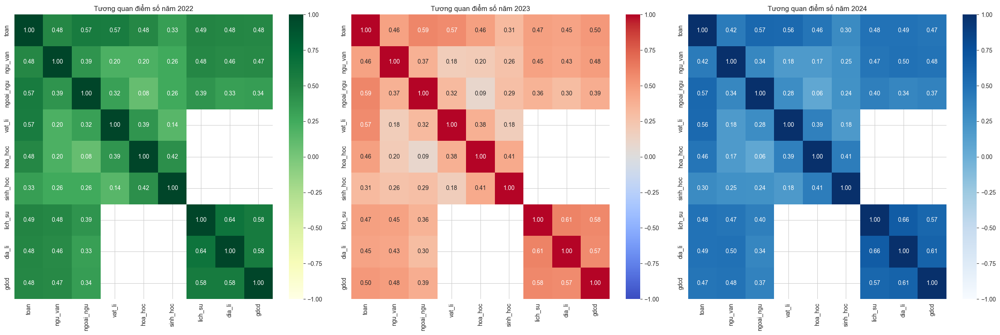

In [30]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8))  # 1 hàng, 3 cột, kích thước tổng

# Heatmap 1: Năm 2022
a_2022 = df_2022[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
s_matrix_2022 = a_2022.corr()
sns.heatmap(s_matrix_2022, annot=True, cmap='YlGn', fmt='.2f', vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title('Tương quan điểm số năm 2022')

# Heatmap 2: Năm 2023
a_2023 = df_2023[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
s_matrix_2023 = a_2023.corr()
sns.heatmap(s_matrix_2023, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title('Tương quan điểm số năm 2023')

# Heatmap 3: Năm 2024
a_2024 = df_2024[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
s_matrix_2024 = a_2024.corr()
sns.heatmap(s_matrix_2024, annot=True, cmap='Blues', fmt='.2f', vmin=-1, vmax=1, ax=axes[2])
axes[2].set_title('Tương quan điểm số năm 2024')

plt.tight_layout()
plt.show()


# Phân tích điểm các khối thi

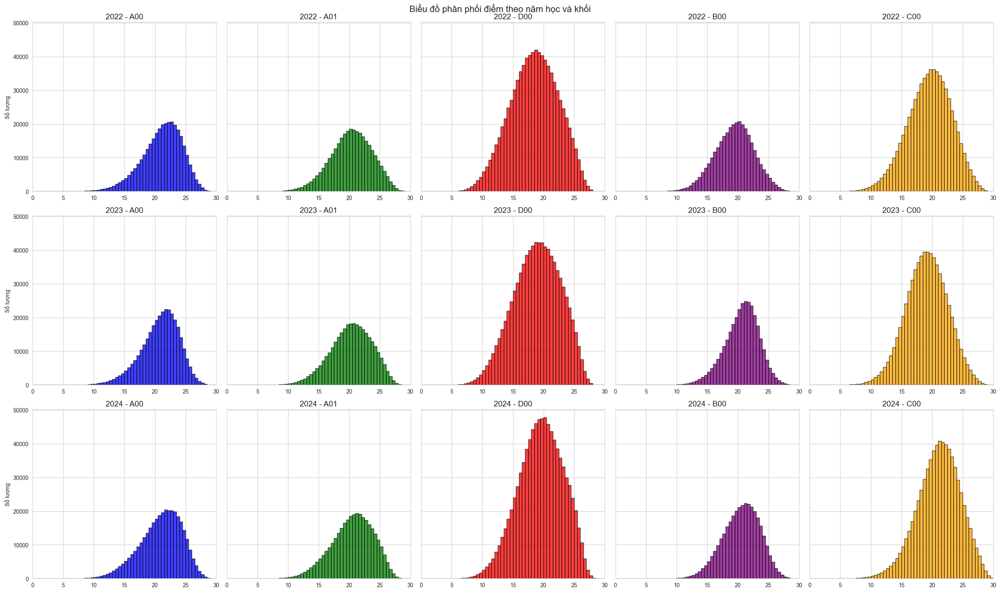

In [31]:
mau_khoi = {
    'a00': 'blue',
    'a01': 'green',
    'd00': 'red',
    'b00': 'purple',
    'c00': 'orange'
}

fig, axes = plt.subplots(len(nam_hoc), 5, figsize=(25, 15), sharey=True)
fig.suptitle('Biểu đồ phân phối điểm theo năm học và khối', fontsize=16)

# Vẽ biểu đồ cho từng khối và năm học
for i, nam in enumerate(nam_hoc):
    for j, khoi in enumerate(['a00', 'a01', 'd00', 'b00', 'c00']):
        # Lọc dữ liệu theo năm và khối
        du_lieu_theo_nam = df_all[df_all['nam_thi'] == nam]
        diem_khoi = du_lieu_theo_nam[khoi]
        mau = mau_khoi[khoi]

        ax = axes[i, j]
        ax.hist(
            diem_khoi,
            bins=60,
            range=(0, 30),
            alpha=0.75,
            color=mau,
            edgecolor='black'
        )
        ax.set_title(f"{nam} - {khoi.upper()}", fontsize=14)
        ax.set_xlim(0, 30)
        ax.set_xticks(range(0, 31, 5))
        # Thiết lập nhãn trục Y cho cột đầu tiên
        if j == 0:
            ax.set_ylabel('Số lượng')

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


# Khối A00 Toán Lý Hóa

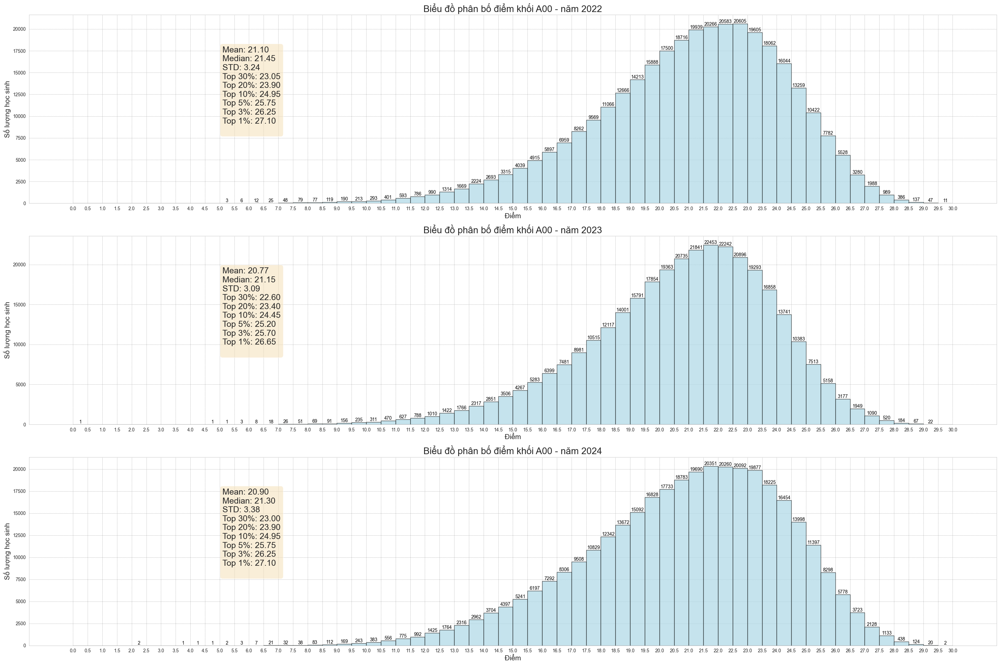

In [32]:
thong_ke_2022 = df_2022['a00'].agg(['mean', 'median', 'std'])
thong_ke_2023 = df_2023['a00'].agg(['mean', 'median', 'std'])
thong_ke_2024 = df_2024['a00'].agg(['mean', 'median', 'std'])
top_2022 = df_2022['a00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2023 = df_2023['a00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2024 = df_2024['a00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# tạo danh sách thông tin từng năm
nam_hoc = [2022, 2023, 2024]
list_df = [df_2022, df_2023, df_2024]
list_thong_ke = [thong_ke_2022, thong_ke_2023, thong_ke_2024]
list_top = [top_2022, top_2023, top_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, nam in enumerate(nam_hoc):
    df = list_df[i]
    thong_ke = list_thong_ke[i]
    top = list_top[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # vẽ biểu đồ phân bố
    n, bins, patches = ax.hist(df['a00'], bins=np.arange(0, 30.5, 0.500000001), edgecolor='black', alpha=0.7, color='lightblue')
    ax.set_title(f'Biểu đồ phân bố điểm khối A00 - năm {nam}', fontsize=20)
    ax.set_xlabel('Điểm', fontsize=15)
    ax.set_ylabel('Số lượng học sinh', fontsize=15)
    ax.set_xticks(np.arange(0, 30.5, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # hiển thị số lượng học sinh trên các cột
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}',
                    ha='center', va='bottom', fontsize=10, color='black')

    # chú thích
    text = (
        f"Mean: {thong_ke['mean']:.2f}\n"
        f"Median: {thong_ke['median']:.2f}\n"
        f"STD: {(thong_ke['std']):.2f}\n"
    )
    for pct, diem in top.items():
        text += f"Top {int((1 - pct) * 100 + 0.00001)}%: {diem:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, text, transform=ax.transAxes, fontsize=18,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.show()


Tổng số thí sinh thi A00 là: 343800


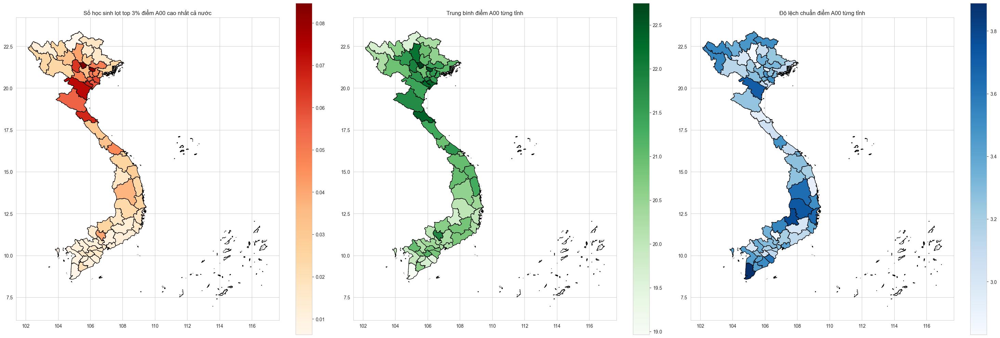

In [33]:
# LỌC DỮ LIỆU A00
a00 = df_2024[['a00', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi A00 là: ' + str(len(a00)))

# TÍNH TOP 3% ĐIỂM A00
tong = a00['tinh_thi'].value_counts()
top3 = a00[a00['a00'] >= a00['a00'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM A00 TỪNG TỈNH
mean_a00 = a00.groupby('tinh_thi')['a00'].mean().reset_index()
mean_a00.columns = ['Tỉnh thi', 'Trung bình điểm A00']
gdf_mean = gdf.merge(mean_a00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM A00 TỪNG TỈNH
std_a00 = a00.groupby('tinh_thi')['a00'].std().reset_index()
std_a00.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm A00']
gdf_std = gdf.merge(std_a00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM A00
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm A00 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM A00
gdf_mean.plot(
    column='Trung bình điểm A00',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm A00 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM A00
gdf_std.plot(
    column='Độ lệch chuẩn điểm A00',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm A00 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


# Khối A01 Toán Lý Anh

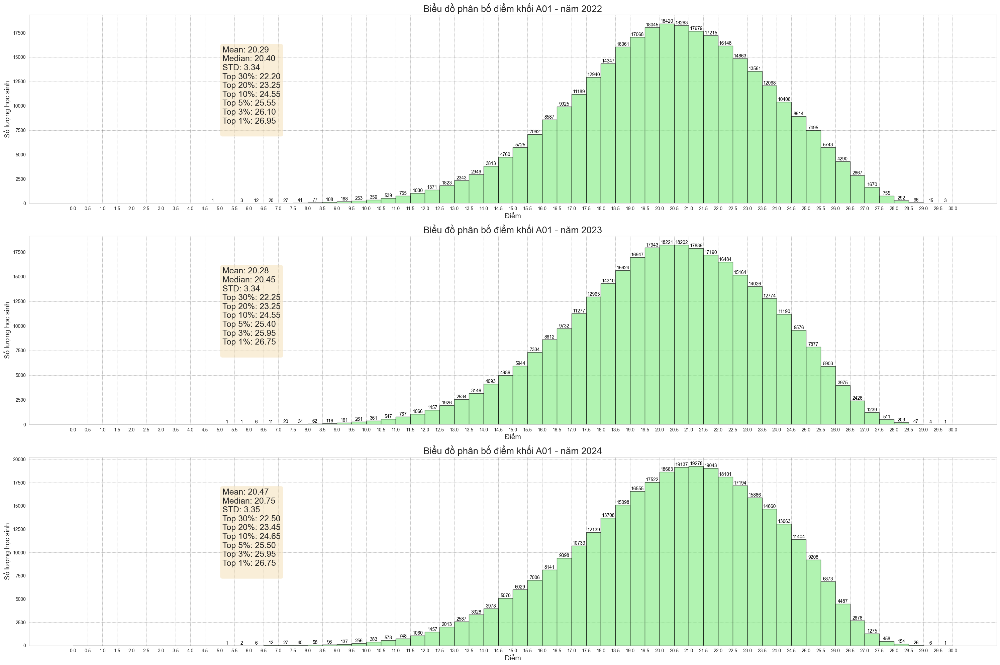

In [34]:
thong_ke_2022 = df_2022['a01'].agg(['mean', 'median', 'std'])
thong_ke_2023 = df_2023['a01'].agg(['mean', 'median', 'std'])
thong_ke_2024 = df_2024['a01'].agg(['mean', 'median', 'std'])
top_2022 = df_2022['a01'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2023 = df_2023['a01'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2024 = df_2024['a01'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# tạo danh sách thông tin từng năm
nam_hoc = [2022, 2023, 2024]
list_df = [df_2022, df_2023, df_2024]
list_thong_ke = [thong_ke_2022, thong_ke_2023, thong_ke_2024]
list_top = [top_2022, top_2023, top_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, nam in enumerate(nam_hoc):
    df = list_df[i]
    thong_ke = list_thong_ke[i]
    top = list_top[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # vẽ biểu đồ phân bố
    n, bins, patches = ax.hist(df['a01'], bins=np.arange(0, 30.5, 0.500000001), edgecolor='black', alpha=0.7, color='lightgreen')
    ax.set_title(f'Biểu đồ phân bố điểm khối A01 - năm {nam}', fontsize=20)
    ax.set_xlabel('Điểm', fontsize=15)
    ax.set_ylabel('Số lượng học sinh', fontsize=15)
    ax.set_xticks(np.arange(0, 30.5, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # hiển thị số lượng học sinh trên các cột
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}',
                    ha='center', va='bottom', fontsize=10, color='black')

    # chú thích
    text = (
        f"Mean: {thong_ke['mean']:.2f}\n"
        f"Median: {thong_ke['median']:.2f}\n"
        f"STD: {(thong_ke['std']):.2f}\n"
    )
    for pct, diem in top.items():
        text += f"Top {int((1 - pct) * 100 + 0.00001)}%: {diem:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, text, transform=ax.transAxes, fontsize=18,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.show()


Tổng số thí sinh thi A01 là: 329761


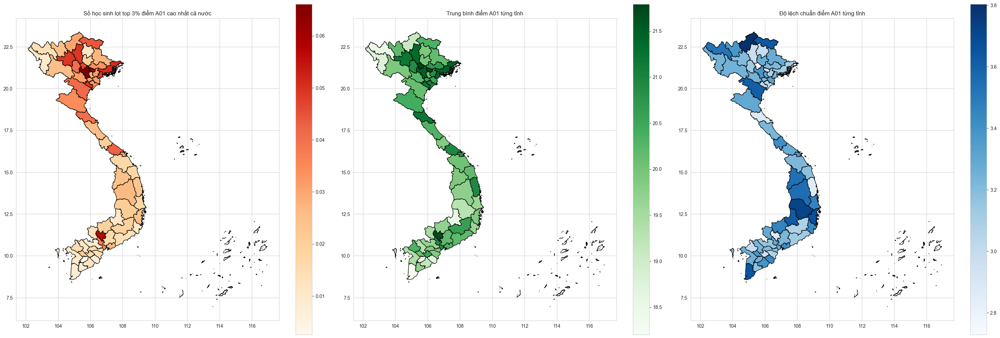

In [35]:
# LỌC DỮ LIỆU A01
a01 = df_2024[['a01', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi A01 là: ' + str(len(a01)))

# TÍNH TOP 3% ĐIỂM A01
tong = a01['tinh_thi'].value_counts()
top3 = a01[a01['a01'] >= a01['a01'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM A01 TỪNG TỈNH
mean_a01 = a01.groupby('tinh_thi')['a01'].mean().reset_index()
mean_a01.columns = ['Tỉnh thi', 'Trung bình điểm A01']
gdf_mean = gdf.merge(mean_a01, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM A01 TỪNG TỈNH
std_a01 = a01.groupby('tinh_thi')['a01'].std().reset_index()
std_a01.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm A01']
gdf_std = gdf.merge(std_a01, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM A01
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm A01 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM A01
gdf_mean.plot(
    column='Trung bình điểm A01',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm A01 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM A01
gdf_std.plot(
    column='Độ lệch chuẩn điểm A01',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm A01 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


# Khối D00 Toán Văn Anh

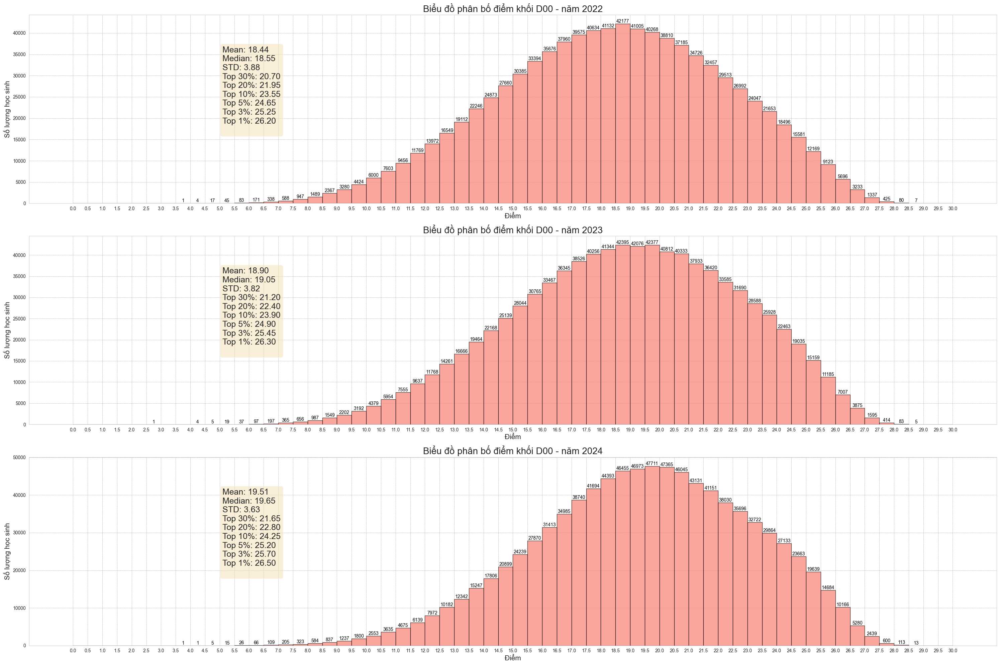

In [36]:
thong_ke_2022 = df_2022['d00'].agg(['mean', 'median', 'std'])
thong_ke_2023 = df_2023['d00'].agg(['mean', 'median', 'std'])
thong_ke_2024 = df_2024['d00'].agg(['mean', 'median', 'std'])
top_2022 = df_2022['d00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2023 = df_2023['d00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2024 = df_2024['d00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# tạo danh sách thông tin từng năm
nam_hoc = [2022, 2023, 2024]
list_df = [df_2022, df_2023, df_2024]
list_thong_ke = [thong_ke_2022, thong_ke_2023, thong_ke_2024]
list_top = [top_2022, top_2023, top_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, nam in enumerate(nam_hoc):
    df = list_df[i]
    thong_ke = list_thong_ke[i]
    top = list_top[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # vẽ biểu đồ phân bố
    n, bins, patches = ax.hist(df['d00'], bins=np.arange(0, 30.5, 0.500000001), edgecolor='black', alpha=0.7, color='salmon')
    ax.set_title(f'Biểu đồ phân bố điểm khối D00 - năm {nam}', fontsize=20)
    ax.set_xlabel('Điểm', fontsize=15)
    ax.set_ylabel('Số lượng học sinh', fontsize=15)
    ax.set_xticks(np.arange(0, 30.5, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # hiển thị số lượng học sinh trên các cột
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}',
                    ha='center', va='bottom', fontsize=10, color='black')

    # chú thích
    text = (
        f"Mean: {thong_ke['mean']:.2f}\n"
        f"Median: {thong_ke['median']:.2f}\n"
        f"STD: {(thong_ke['std']):.2f}\n"
    )
    for pct, diem in top.items():
        text += f"Top {int((1 - pct) * 100 + 0.00001)}%: {diem:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, text, transform=ax.transAxes, fontsize=18,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.show()


Tổng số thí sinh thi D00 là: 908866


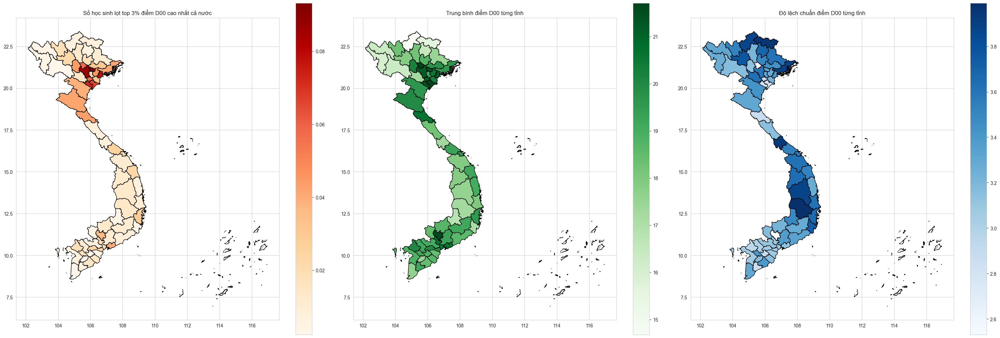

In [37]:
    # LỌC DỮ LIỆU D00
d00 = df_2024[['d00', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi D00 là: ' + str(len(d00)))

# TÍNH TOP 3% ĐIỂM D00
tong = d00['tinh_thi'].value_counts()
top3 = d00[d00['d00'] >= d00['d00'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM D00 TỪNG TỈNH
mean_d00 = d00.groupby('tinh_thi')['d00'].mean().reset_index()
mean_d00.columns = ['Tỉnh thi', 'Trung bình điểm D00']
gdf_mean = gdf.merge(mean_d00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM D00 TỪNG TỈNH
std_d00 = d00.groupby('tinh_thi')['d00'].std().reset_index()
std_d00.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm D00']
gdf_std = gdf.merge(std_d00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM D00
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm D00 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM D00
gdf_mean.plot(
    column='Trung bình điểm D00',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm D00 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM D00
gdf_std.plot(
    column='Độ lệch chuẩn điểm D00',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm D00 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


# Khối B00 Toán Hóa Sinh

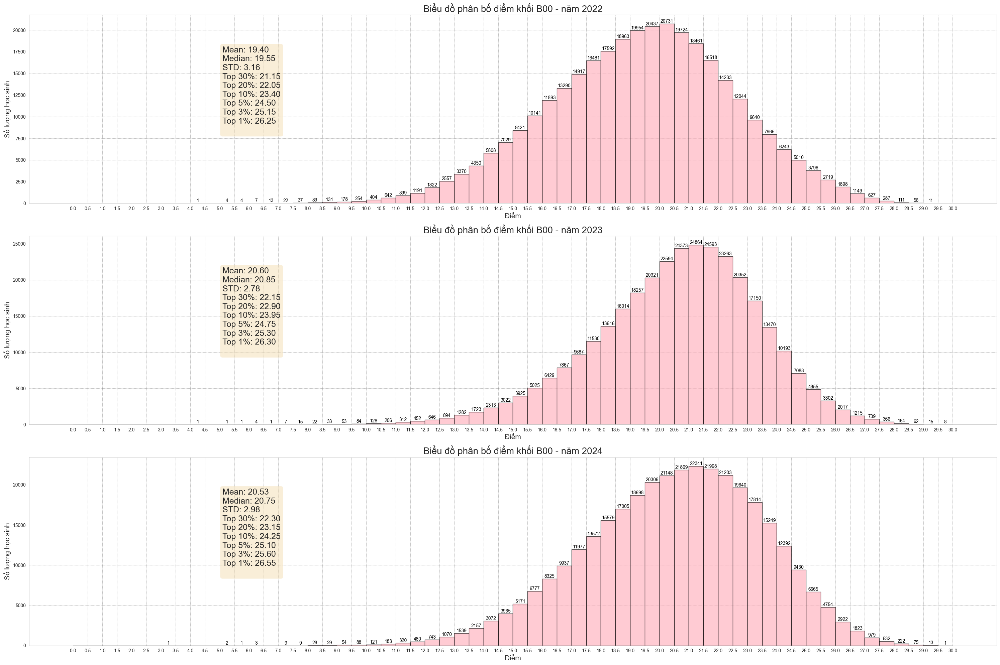

In [38]:
thong_ke_2022 = df_2022['b00'].agg(['mean', 'median', 'std'])
thong_ke_2023 = df_2023['b00'].agg(['mean', 'median', 'std'])
thong_ke_2024 = df_2024['b00'].agg(['mean', 'median', 'std'])
top_2022 = df_2022['b00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2023 = df_2023['b00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2024 = df_2024['b00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# tạo danh sách thông tin từng năm
nam_hoc = [2022, 2023, 2024]
list_df = [df_2022, df_2023, df_2024]
list_thong_ke = [thong_ke_2022, thong_ke_2023, thong_ke_2024]
list_top = [top_2022, top_2023, top_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, nam in enumerate(nam_hoc):
    df = list_df[i]
    thong_ke = list_thong_ke[i]
    top = list_top[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # vẽ biểu đồ phân bố
    n, bins, patches = ax.hist(df['b00'], bins=np.arange(0, 30.5, 0.500000001), edgecolor='black', alpha=0.7, color='lightpink')
    ax.set_title(f'Biểu đồ phân bố điểm khối B00 - năm {nam}', fontsize=20)
    ax.set_xlabel('Điểm', fontsize=15)
    ax.set_ylabel('Số lượng học sinh', fontsize=15)
    ax.set_xticks(np.arange(0, 30.5, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # hiển thị số lượng học sinh trên các cột
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}',
                    ha='center', va='bottom', fontsize=10, color='black')

    # chú thích
    text = (
        f"Mean: {thong_ke['mean']:.2f}\n"
        f"Median: {thong_ke['median']:.2f}\n"
        f"STD: {(thong_ke['std']):.2f}\n"
    )
    for pct, diem in top.items():
        text += f"Top {int((1 - pct) * 100 + 0.00001)}%: {diem:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, text, transform=ax.transAxes, fontsize=18,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.show()


Tổng số thí sinh thi B00 là: 342291


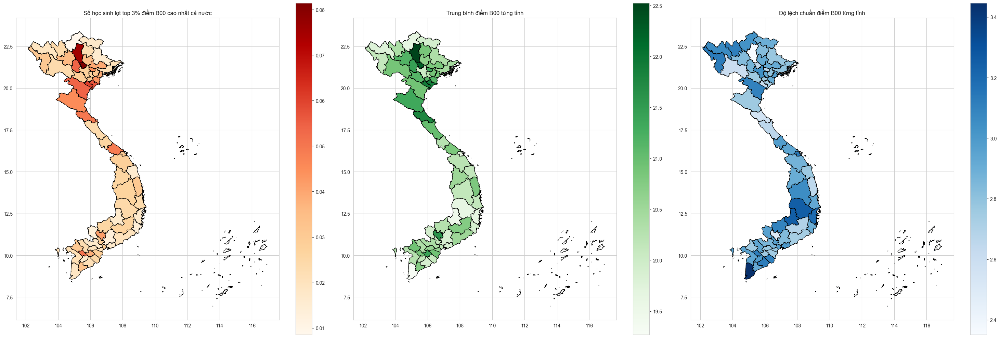

In [39]:
    # LỌC DỮ LIỆU B00
b00 = df_2024[['b00', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi B00 là: ' + str(len(b00)))

# TÍNH TOP 3% ĐIỂM B00
tong = b00['tinh_thi'].value_counts()
top3 = b00[b00['b00'] >= b00['b00'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM B00 TỪNG TỈNH
mean_b00 = b00.groupby('tinh_thi')['b00'].mean().reset_index()
mean_b00.columns = ['Tỉnh thi', 'Trung bình điểm B00']
gdf_mean = gdf.merge(mean_b00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM B00 TỪNG TỈNH
std_b00 = b00.groupby('tinh_thi')['b00'].std().reset_index()
std_b00.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm B00']
gdf_std = gdf.merge(std_b00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM B00
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm B00 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM B00
gdf_mean.plot(
    column='Trung bình điểm B00',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm B00 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM B00
gdf_std.plot(
    column='Độ lệch chuẩn điểm B00',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm B00 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


# Khối C00 Văn Sử Địa

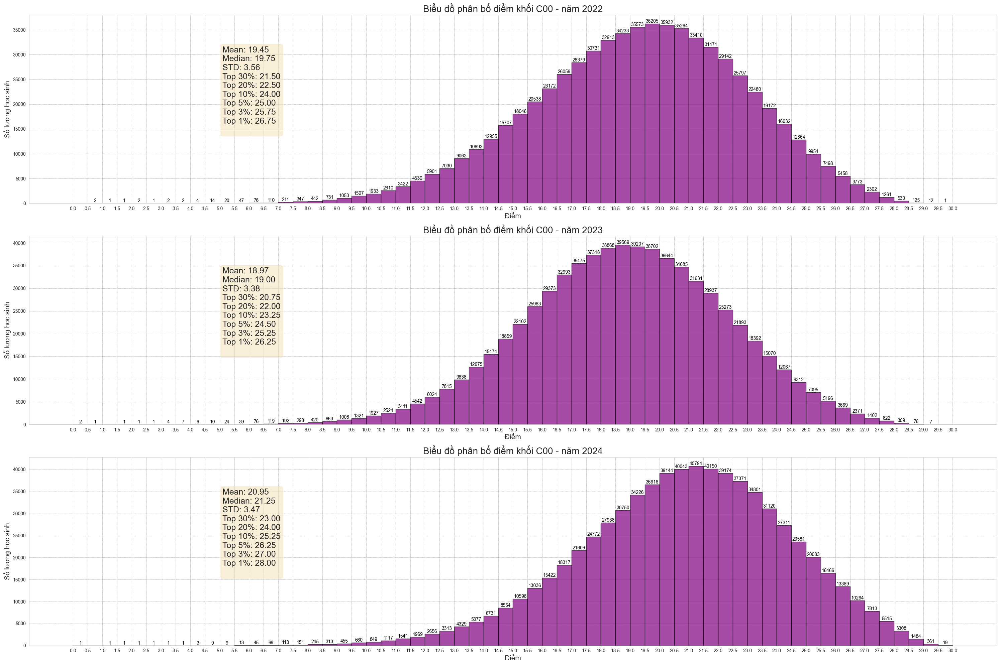

In [40]:
thong_ke_2022 = df_2022['c00'].agg(['mean', 'median', 'std'])
thong_ke_2023 = df_2023['c00'].agg(['mean', 'median', 'std'])
thong_ke_2024 = df_2024['c00'].agg(['mean', 'median', 'std'])
top_2022 = df_2022['c00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2023 = df_2023['c00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])
top_2024 = df_2024['c00'].quantile([0.70, 0.80, 0.90, 0.95, 0.97, 0.99])

# tạo danh sách thông tin từng năm
nam_hoc = [2022, 2023, 2024]
list_df = [df_2022, df_2023, df_2024]
list_thong_ke = [thong_ke_2022, thong_ke_2023, thong_ke_2024]
list_top = [top_2022, top_2023, top_2024]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 20), facecolor='white')
fig.patch.set_facecolor('white')

for i, nam in enumerate(nam_hoc):
    df = list_df[i]
    thong_ke = list_thong_ke[i]
    top = list_top[i]
    ax = axes[i]
    ax.set_facecolor('white')

    # vẽ biểu đồ phân bố
    n, bins, patches = ax.hist(df['c00'], bins=np.arange(0, 30.5, 0.500000001), edgecolor='black', alpha=0.7, color='purple')
    ax.set_title(f'Biểu đồ phân bố điểm khối C00 - năm {nam}', fontsize=20)
    ax.set_xlabel('Điểm', fontsize=15)
    ax.set_ylabel('Số lượng học sinh', fontsize=15)
    ax.set_xticks(np.arange(0, 30.5, 0.5))
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.7)

    # hiển thị số lượng học sinh trên các cột
    for rect, count in zip(patches, n):
        height = rect.get_height()
        if height > 0:
            ax.text(rect.get_x() + rect.get_width() / 2, height, f'{int(count)}',
                    ha='center', va='bottom', fontsize=10, color='black')

    # chú thích
    text = (
        f"Mean: {thong_ke['mean']:.2f}\n"
        f"Median: {thong_ke['median']:.2f}\n"
        f"STD: {(thong_ke['std']):.2f}\n"
    )
    for pct, diem in top.items():
        text += f"Top {int((1 - pct) * 100 + 0.00001)}%: {diem:.2f}\n"

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.2, 0.6, text, transform=ax.transAxes, fontsize=18,
            verticalalignment='center', bbox=props)

plt.tight_layout()
plt.show()


Tổng số thí sinh thi C00 là: 704008


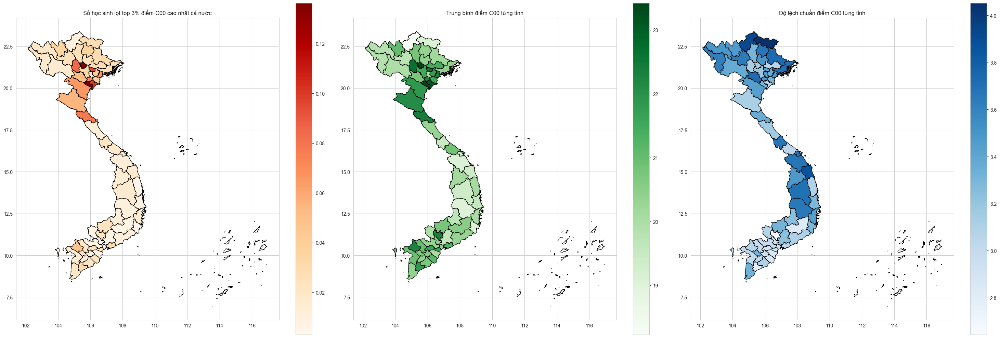

In [41]:
# LỌC DỮ LIỆU C00
c00 = df_2024[['c00', 'tinh_thi']].dropna()
print('Tổng số thí sinh thi C00 là: ' + str(len(c00)))

# TÍNH TOP 3% ĐIỂM C00
tong = c00['tinh_thi'].value_counts()
top3 = c00[c00['c00'] >= c00['c00'].quantile(0.97)]
Sr_top3 = top3['tinh_thi'].value_counts()
df_top3 = pd.DataFrame({
    'Tỉnh thi': Sr_top3.index,
    'Tỉ lệ thí sinh lọt top 3%': (Sr_top3 / tong.loc[Sr_top3.index]).values
})
gdf_top3 = gdf.merge(df_top3, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH TRUNG BÌNH ĐIỂM C00 TỪNG TỈNH
mean_c00 = c00.groupby('tinh_thi')['c00'].mean().reset_index()
mean_c00.columns = ['Tỉnh thi', 'Trung bình điểm C00']
gdf_mean = gdf.merge(mean_c00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# TÍNH ĐỘ LỆCH CHUẨN ĐIỂM C00 TỪNG TỈNH
std_c00 = c00.groupby('tinh_thi')['c00'].std().reset_index()
std_c00.columns = ['Tỉnh thi', 'Độ lệch chuẩn điểm C00']
gdf_std = gdf.merge(std_c00, left_on='ten_tinh', right_on='Tỉnh thi', how='left')

# THIẾT LẬP KÍCH THƯỚC VÀ BỐ CỤC BIỂU ĐỒ
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# BIỂU ĐỒ 1: TOP 3% ĐIỂM C00
gdf_top3.plot(
    column='Tỉ lệ thí sinh lọt top 3%',
    ax=axes[0],
    cmap='OrRd',
    edgecolor='black',
    legend=True
)
axes[0].set_title('Số học sinh lọt top 3% điểm C00 cao nhất cả nước')

# BIỂU ĐỒ 2: TRUNG BÌNH ĐIỂM C00
gdf_mean.plot(
    column='Trung bình điểm C00',
    ax=axes[1],
    cmap='Greens',
    edgecolor='black',
    legend=True
)
axes[1].set_title('Trung bình điểm C00 từng tỉnh')

# BIỂU ĐỒ 3: ĐỘ LỆCH CHUẨN ĐIỂM C00
gdf_std.plot(
    column='Độ lệch chuẩn điểm C00',
    ax=axes[2],
    cmap='Blues',
    edgecolor='black',
    legend=True
)
axes[2].set_title('Độ lệch chuẩn điểm C00 từng tỉnh')

# TÙY CHỈNH VÀ HIỂN THỊ
plt.tight_layout()
plt.show()


# Biểu đồ tương quan giữa các khối thi

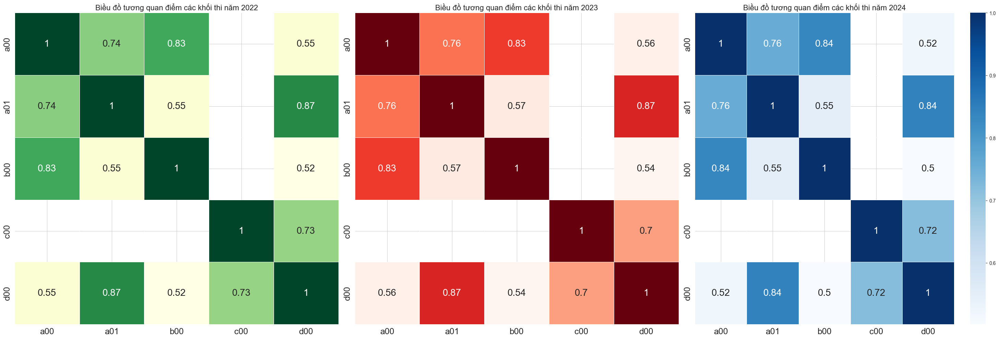

In [42]:
years = [2022, 2023, 2024]

df = [df_2022, df_2023, df_2024]
selected_columns = ['a00', 'a01', 'b00', 'c00', 'd00']
colormaps = ['YlGn', 'Reds', 'Blues']
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

for i, year in enumerate(years):
    selected_df = df[i][selected_columns]
    corr_matrix = selected_df.corr()
    sns.heatmap(corr_matrix, annot=True, cmap=colormaps[i], ax=axes[i], cbar=(i == 2), linewidths=0.5, linecolor='white', annot_kws={"size": 20})
    axes[i].set_title(f'Biều đồ tương quan điểm các khối thi năm {year}', fontsize=16)
    axes[i].tick_params(axis='both', which='major', labelsize=18)  # Tăng kích thước nhãn trục

plt.subplots_adjust(wspace=1.5, hspace=0.75)
plt.tight_layout()
plt.show()


# Chứng minh giả thuyết càng giỏi Toán thì càng giỏi Lý

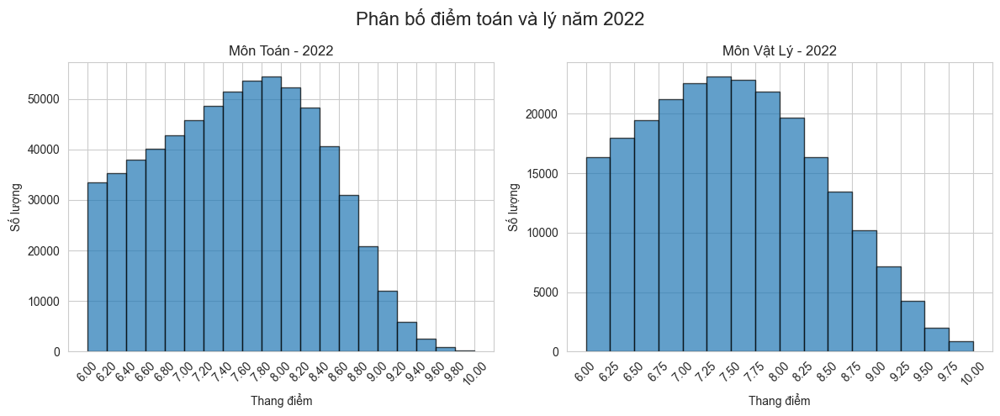

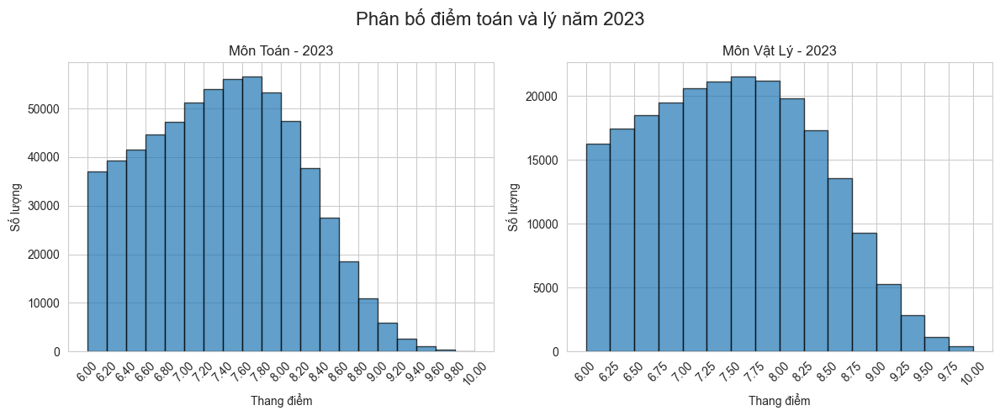

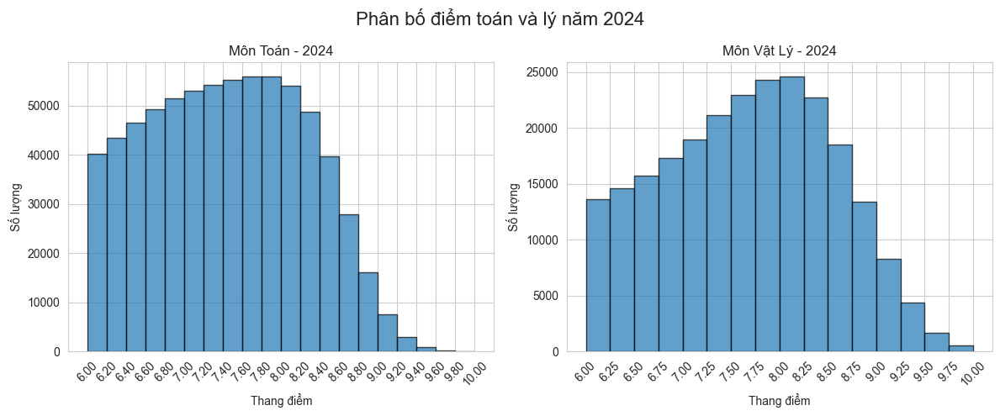

In [2]:
bin1 = [6.0, 6.2, 6.4, 6.6, 6.8, 7.0, 7.2, 7.4, 7.6, 7.8, 8.0, 8.2, 8.4, 8.6, 8.8, 9.0, 9.2, 9.4, 9.6, 9.8, 10.0]
bin2 = [6.0, 6.25, 6.5, 6.75, 7.0, 7.25, 7.5, 7.75, 8.0, 8.25, 8.5, 8.75, 9.0, 9.25, 9.5, 9.75, 10.0]
for data, year in zip([df_2022, df_2023, df_2024], ['2022', '2023', '2024']):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    # Bểu đồ phân bố điểm toán
    axes[0].hist(data['toan'], bins=bin1, edgecolor='black', alpha=0.7)
    axes[0].set_title(f'Môn Toán - {year}')
    axes[0].set_xlabel('Thang điểm')
    axes[0].set_ylabel('Số lượng')
    axes[0].set_xticks(bin1)
    axes[0].set_xticklabels([f'{b:.2f}' for b in bin1], rotation=45)
    # Biểu đồ phân bố điểm lý
    axes[1].hist(data['vat_li'], bins=bin2, edgecolor='black', alpha=0.7)
    axes[1].set_title(f'Môn Vật Lý - {year}')
    axes[1].set_xlabel('Thang điểm')
    axes[1].set_ylabel('Số lượng')
    axes[1].set_xticks(bin2)
    axes[1].set_xticklabels([f'{b:.2f}' for b in bin2], rotation=45)

    fig.suptitle(f'Phân bố điểm toán và lý năm {year}', fontsize=16)
    plt.tight_layout()
    plt.show()

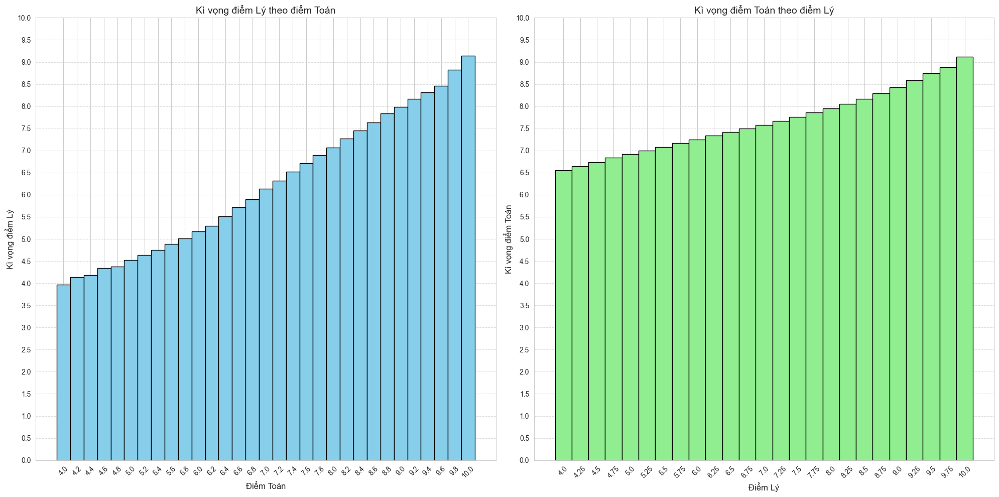

In [44]:
# Lọc dữ liệu cho điểm Toán >= 4 và Lý >= 4
df_toan = df_2023[df_2023['toan'] >= 4]
df_li = df_2023[df_2023['vat_li'] >= 4]

df1_toan = df_toan.loc[(df_toan['toan'].notnull() & df_toan['vat_li'].notnull()), ['toan', 'vat_li']]
df1_li = df_li.loc[(df_li['toan'].notnull() & df_li['vat_li'].notnull()), ['toan', 'vat_li']]

# Tính kì vọng điểm Lý theo điểm Toán
toan_li = df1_toan.groupby('toan', as_index=False)['vat_li'].mean()
toan_li.rename(columns={'vat_li': 'ki_vong_li'}, inplace=True)

# Tính kì vọng điểm Toán theo điểm Lý
li_toan = df1_li.groupby('vat_li', as_index=False)['toan'].mean()
li_toan.rename(columns={'toan': 'ki_vong_toan'}, inplace=True)

# Tạo 1 hàng 2 cột để vẽ 2 biểu đồ
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
k = [0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0]
# Biểu đồ 1: Kì vọng điểm Lý theo điểm Toán
axes[0].bar(toan_li['toan'], toan_li['ki_vong_li'], width=0.2, edgecolor='black', color='skyblue')
axes[0].set_title('Kì vọng điểm Lý theo điểm Toán', fontsize=14)
axes[0].set_xlabel('Điểm Toán', fontsize=12)
axes[0].set_ylabel('Kì vọng điểm Lý', fontsize=12)
axes[0].set_xticks(toan_li['toan'])
axes[0].set_yticks(k)
axes[0].set_xticklabels(toan_li['toan'], rotation=45)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Biểu đồ 2: Kì vọng điểm Toán theo điểm Lý
axes[1].bar(li_toan['vat_li'], li_toan['ki_vong_toan'], width=0.25, edgecolor='black', color='lightgreen')
axes[1].set_title('Kì vọng điểm Toán theo điểm Lý', fontsize=14)
axes[1].set_xlabel('Điểm Lý', fontsize=12)
axes[1].set_ylabel('Kì vọng điểm Toán', fontsize=12)
axes[1].set_xticks(li_toan['vat_li'])
axes[1].set_yticks(k)
axes[1].set_xticklabels(li_toan['vat_li'], rotation=45)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Cải thiện hiển thị
plt.tight_layout()

# Hiển thị biểu đồ
plt.show()


# Chứng minh giả thuyết các tỉnh/thành phố phát triển học giỏi tiếng Anh hơn các tỉnh còn lại

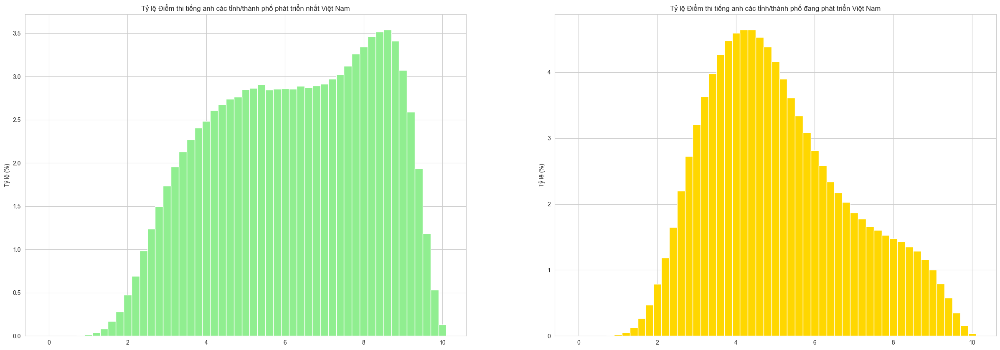

In [45]:
# tạo 1 dataframe cho 7 tỉnh thành phố lớn ở Việt Nam
thanh_pho = ['Hà Nội', 'TP. Hồ Chí Minh', 'Bình Dương', 'Bà Rịa - Vũng Tàu', 'Đà Nẵng', 'Hải Phòng', 'Quảng Ninh']
df_thanh_pho = df_all[df_all['tinh_thi'].isin(thanh_pho)]
df_diem_tp = pd.DataFrame({
    'Điểm thi': df_thanh_pho['ngoai_ngu'].value_counts().index,
    'Số lượng': df_thanh_pho['ngoai_ngu'].value_counts().values,
})
total_tp = df_diem_tp['Số lượng'].sum()
df_diem_tp['Tỷ lệ (%)'] = (df_diem_tp['Số lượng'] / total_tp) * 100

# tạo dataframe cho các tỉnh còn lại
df_nong_thon = df_all[~df_all['tinh_thi'].isin(thanh_pho)]
df_diem_nt = pd.DataFrame({
    'Điểm thi': df_nong_thon['ngoai_ngu'].value_counts().index,
    'Số lượng': df_nong_thon['ngoai_ngu'].value_counts().values,
})
total_nt = df_diem_nt['Số lượng'].sum()
df_diem_nt['Tỷ lệ (%)'] = (df_diem_nt['Số lượng'] / total_nt) * 100

# Vẽ biểu đồ
fig, ax = plt.subplots(1, 2, figsize=(30, 10))

ax[0].bar(df_diem_tp['Điểm thi'], df_diem_tp['Tỷ lệ (%)'], width=0.2, color='lightgreen')
ax[0].set_title('Tỷ lệ Điểm thi tiếng anh các tỉnh/thành phố phát triển nhất Việt Nam')
ax[0].set_ylabel('Tỷ lệ (%)')

ax[1].bar(df_diem_nt['Điểm thi'], df_diem_nt['Tỷ lệ (%)'], width=0.2, color='#FFD700')
ax[1].set_title('Tỷ lệ Điểm thi tiếng anh các tỉnh/thành phố đang phát triển Việt Nam')
ax[1].set_ylabel('Tỷ lệ (%)')

# Display the plots
plt.show()


# Chứng minh giả thuyết Miền  Bắc học khối A00, A01, D00 tốt hơn miền Nam

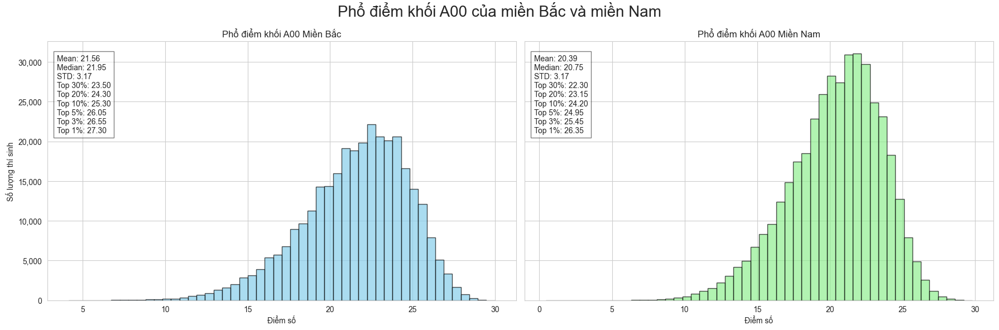

In [46]:
mien_bac = [
    'Hà Nội', 'Hải Phòng', 'Quảng Ninh', 'Hà Giang', 'Cao Bằng', 'Bắc Kạn',
    'Tuyên Quang', 'Lào Cai', 'Điện Biên', 'Lai Châu', 'Sơn La', 'Yên Bái',
    'Hòa Bình', 'Thái Nguyên', 'Lạng Sơn', 'Bắc Giang', 'Phú Thọ', 'Vĩnh Phúc',
    'Bắc Ninh', 'Hải Dương', 'Hưng Yên', 'Thái Bình', 'Nam Định', 'Ninh Bình', 'Hà Nam'
]

mien_trung = [
    'Thanh Hóa', 'Nghệ An', 'Hà Tĩnh', 'Quảng Bình', 'Quảng Trị', 'Thừa Thiên Huế',
    'Đà Nẵng', 'Quảng Nam', 'Quảng Ngãi', 'Bình Định', 'Phú Yên', 'Khánh Hòa',
    'Ninh Thuận', 'Bình Thuận', 'Kon Tum', 'Gia Lai', 'Đăk Lăk', 'Đăk Nông', 'Lâm Đồng'
]

mien_nam = [
    'TP. Hồ Chí Minh', 'Bình Dương', 'Đồng Nai', 'Tây Ninh', 'Bà Rịa - Vũng Tàu',
    'Long An', 'Đồng Tháp', 'Tiền Giang', 'An Giang', 'Bến Tre', 'Vĩnh Long',
    'Trà Vinh', 'Hậu Giang', 'Kiên Giang', 'Sóc Trăng', 'Bạc Liêu', 'Cà Mau', 'Cần Thơ'
]
df_mien_bac = df_all[df_all['tinh_thi'].isin(mien_bac)]
df_mien_nam = df_all[df_all['tinh_thi'].isin(mien_nam)]
a00_mien_bac = df_mien_bac['a00'].dropna()
a00_mien_nam = df_mien_nam['a00'].dropna()

top_mien_bac = {
    'Top 30%': np.percentile(a00_mien_bac, 70),
    'Top 20%': np.percentile(a00_mien_bac, 80),
    'Top 10%': np.percentile(a00_mien_bac, 90),
    'Top 5%': np.percentile(a00_mien_bac, 95),
    'Top 3%': np.percentile(a00_mien_bac, 97),
    'Top 1%': np.percentile(a00_mien_bac, 99)
}

top_mien_nam = {
    'Top 30%': np.percentile(a00_mien_nam, 70),
    'Top 20%': np.percentile(a00_mien_nam, 80),
    'Top 10%': np.percentile(a00_mien_nam, 90),
    'Top 5%': np.percentile(a00_mien_nam, 95),
    'Top 3%': np.percentile(a00_mien_nam, 97),
    'Top 1%': np.percentile(a00_mien_nam, 99)
}
mean_mien_bac = a00_mien_bac.mean()
median_mien_bac = a00_mien_bac.median()
std_mien_bac = a00_mien_bac.std()

mean_mien_nam = a00_mien_nam.mean()
median_mien_nam = a00_mien_nam.median()
std_mien_nam = a00_mien_nam.std()
# Updated stats text for miền Bắc
stats_mien_bac = (
    f"Mean: {mean_mien_bac:.2f}\n"
    f"Median: {median_mien_bac:.2f}\n"
    f"STD: {std_mien_bac:.2f}\n"
    + "\n".join([f"{k}: {val:.2f}" for k, val in top_mien_bac.items()])
)

# Updated stats text for miền Nam
stats_mien_nam = (
    f"Mean: {mean_mien_nam:.2f}\n"
    f"Median: {median_mien_nam:.2f}\n"
    f"STD: {std_mien_nam:.2f}\n"
    + "\n".join([f"{k}: {val:.2f}" for k, val in top_mien_nam.items()])
)

# Plotting the distributions with updated stats
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)
plt.suptitle('Phổ điểm khối A00 của miền Bắc và miền Nam', size = 20)
# Plot for miền Bắc
axes[0].hist(a00_mien_bac, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
axes[0].set_title('Phổ điểm khối A00 Miền Bắc')
axes[0].set_xlabel('Điểm số')
axes[0].set_ylabel('Số lượng thí sinh')
axes[0].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
axes[0].text(
    0.02, 0.95, stats_mien_bac,
    transform=axes[0].transAxes, verticalalignment='top', fontsize=10,
    bbox=dict(facecolor='white', edgecolor='black', alpha=0.5)
)

# Plot for miền Nam
axes[1].hist(a00_mien_nam, bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
axes[1].set_title('Phổ điểm khối A00 Miền Nam')
axes[1].set_xlabel('Điểm số')
axes[1].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
axes[1].text(
    0.02, 0.95, stats_mien_nam,
    transform=axes[1].transAxes, verticalalignment='top', fontsize=10,
    bbox=dict(facecolor='white', edgecolor='black', alpha=0.5)
)

plt.tight_layout()
plt.show()


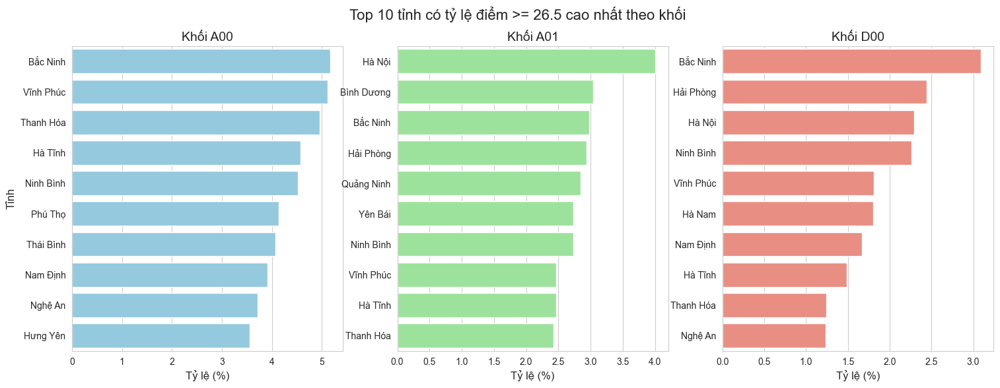

In [47]:
# Tính tỷ lệ thí sinh có điểm >= 26.5 theo khối
def tinh_ty_le_diem_cao(data, mon, moc_diem):
    # Đếm tổng số thí sinh mỗi tỉnh
    tong_thi_sinh = data.groupby('tinh_thi')[mon].count()
    # Đếm số lượng thí sinh đạt điểm >= 26.5 mỗi tỉnh
    diem_cao = data[data[mon] >= moc_diem].groupby('tinh_thi')[mon].count()
    # Tính tỷ lệ
    ty_le = (diem_cao / tong_thi_sinh).fillna(0) * 100
    return ty_le.reset_index().rename(columns={mon: 'ty_le'})

# Tính tỷ lệ cho từng khối
ty_le_a00 = tinh_ty_le_diem_cao(df_all, 'a00', 26.5)
ty_le_a01 = tinh_ty_le_diem_cao(df_all, 'a01', 26.5)
ty_le_d00 = tinh_ty_le_diem_cao(df_all, 'd00', 26.5)

# Lấy top 10 tỉnh có tỷ lệ cao nhất
top10_a00 = ty_le_a00.nlargest(10, 'ty_le')
top10_a01 = ty_le_a01.nlargest(10, 'ty_le')
top10_d00 = ty_le_d00.nlargest(10, 'ty_le')

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Top 10 tỉnh có tỷ lệ điểm >= 26.5 cao nhất theo khối', fontsize=16)
# Biểu đồ khối A00
sns.barplot(
    x='ty_le',
    y='tinh_thi',
    data=top10_a00,
    color='skyblue',
    ax=axes[0]
)
axes[0].set_title('Khối A00', fontsize=14)
axes[0].set_xlabel('Tỷ lệ (%)', fontsize=12)
axes[0].set_ylabel('Tỉnh', fontsize=12)

# Biểu đồ khối A01
sns.barplot(
    x='ty_le',
    y='tinh_thi',
    data=top10_a01,
    color='lightgreen',
    ax=axes[1]
)
axes[1].set_title('Khối A01', fontsize=14)
axes[1].set_xlabel('Tỷ lệ (%)', fontsize=12)
axes[1].set_ylabel('')  # Không lặp lại nhãn Y

# Biểu đồ khối D00
sns.barplot(
    x='ty_le',
    y='tinh_thi',
    data=top10_d00,
    color='salmon',
    ax=axes[2]
)
axes[2].set_title('Khối D00', fontsize=14)
axes[2].set_xlabel('Tỷ lệ (%)', fontsize=12)
axes[2].set_ylabel('')  # Không lặp lại nhãn Y

# Thêm tiêu đề chung

plt.show()


# Dùng mô hình hồi quy đa biến xác định độ quan trọng của điểm toán và lý trong tổng điểm khối A00

                            OLS Regression Results                            
Dep. Variable:                    a00   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                 8.350e+05
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        08:48:03   Log-Likelihood:            -5.3524e+05
No. Observations:              325902   AIC:                         1.070e+06
Df Residuals:                  325899   BIC:                         1.071e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.5410      0.017     88.272      0.0

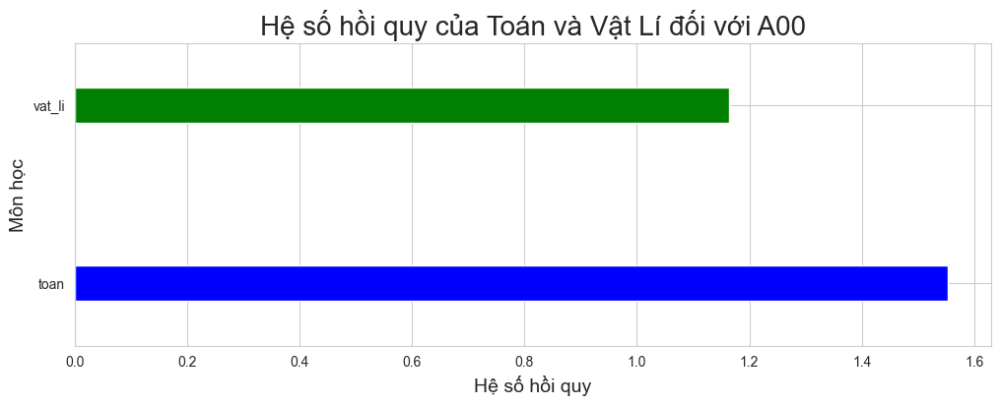

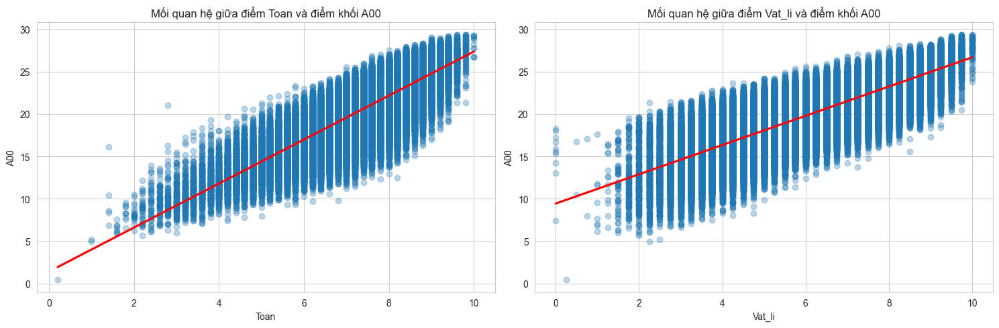

In [2]:
# Lọc dữ liệu
df = df_2023.loc[df_2023[['toan', 'vat_li', 'a00']].notnull().all(axis=1), ['toan', 'vat_li', 'a00']]

#Xác định biến phụ thuộc (y) và biến độc lập (X)
X = df[['toan', 'vat_li']]
y = df['a00']

# Thêm cột intercept cho hồi quy
X = sm.add_constant(X)

#Xây dựng mô hình hồi quy
model = sm.OLS(y, X).fit()

#In kết quả hồi quy
print(model.summary())

#Trực quan hóa hệ số hồi quy
coefficients = model.params[1:]  # Bỏ intercept
plt.figure(figsize=(12, 4))
coefficients.plot(kind='barh', color=['blue', 'green'], width = 0.2 )
plt.title('Hệ số hồi quy của Toán và Vật Lí đối với A00',size = 20)
plt.ylabel('Môn học',fontsize=14)
plt.xlabel('Hệ số hồi quy',fontsize=14)
plt.xticks(rotation=0)
plt.show()

#Trực quan hóa mối quan hệ giữa từng môn và điểm A00
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

for i, col in enumerate(['toan', 'vat_li']):
    sns.regplot(x=col, y='a00', data=df, ax=axes[i], scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'})
    axes[i].set_title(f'Mối quan hệ giữa điểm {col.capitalize()} và điểm khối A00')
    axes[i].set_xlabel(col.capitalize())
    axes[i].set_ylabel('A00')

plt.tight_layout()
plt.show()
